In [ ]:
# Jovian Commit Essentials
# Please retain and execute this cell without modifying the contents for `jovian.commit` to work
!pip install jovian --upgrade -q
import jovian
jovian.set_project('zerotogans-project')
jovian.set_colab_id('1YiGrZ61YVQTPaR-Dqcq9997xhOkPk2cU')

## Dataset Selection

I use `Pokemon Images Dataset` from Kaggle for this project.

Datasets Link: [Pokemon Images Dataset](https://www.kaggle.com/kvpratama/pokemon-images-dataset)



## Understand and describe the modeling objective



*   This is a image dataset. This dataset contains 819 files.
*   I want to use Generative modeling in this dataset.



## Download Dataset

In [1]:
!pip install opendatasets --upgrade --quiet

In [2]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/kvpratama/pokemon-images-dataset'
od.download(dataset_url)

 32%|███▏      | 23.0M/70.9M [00:00<00:00, 241MB/s]

100%|██████████| 70.9M/70.9M [00:00<00:00, 288MB/s]


In [3]:
import os

DATA_DIR = '/content/pokemon-images-dataset/pokemon_jpg'
print(os.listdir(DATA_DIR))

['pokemon_jpg']


In [4]:
print(os.listdir(DATA_DIR+'/pokemon_jpg')[:10])

['710.jpg', '509.jpg', '310.jpg', '708.jpg', '505.jpg', '322.jpg', '312.jpg', '50.jpg', '127-mega.jpg', '697.jpg']


In [5]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T


In [6]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [7]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([T.Resize(image_size),
                                            T.CenterCrop(image_size),
                                            T.ToTensor(),
                                            T.Normalize(*stats)]))
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [8]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [9]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [10]:
def show_images(images,nmax=64):
  fig, ax = plt.subplots(figsize=(8,8))
  ax.set_xticks([]); ax.set_xticks([])
  ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1,2,0))

def show_batch(dl, nmax=64):
  for images, _ in dl:
    show_images(images, nmax)
    break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


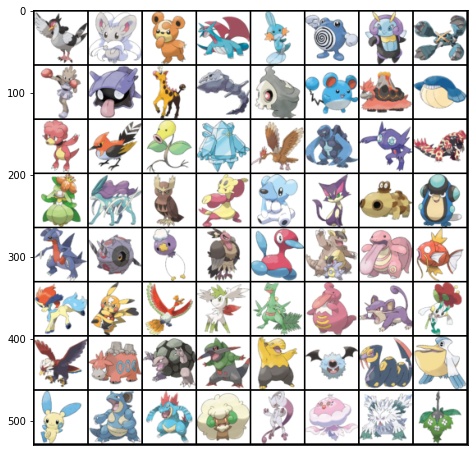

In [11]:
show_batch(train_dl)

In [13]:
project_name = 'zerotogans-project'

In [14]:
!pip install jovian --upgrade --quiet

     |████████████████████████████████| 68 kB 4.1 MB/s 


In [15]:
import jovian

In [16]:
jovian.commit(project="zerotogans-project")

[jovian] Detected Colab notebook...


[jovian] Error: jovian.commit doesn't work on Colab unless the notebook was created and executed from Jovian.
Make sure to run the first code cell at the top after executing from Jovian.
Alternatively, you can download this notebook and upload it manually to Jovian.
Learn more: https://jovian.ai/docs/user-guide/run.html#run-on-colab


In [12]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [13]:
device = get_default_device()
device

device(type='cuda')

In [14]:
train_dl = DeviceDataLoader(train_dl, device)

In [15]:
import torch.nn as nn

In [16]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [17]:
discriminator = to_device(discriminator, device)

In [18]:
latent_size = 128

In [19]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


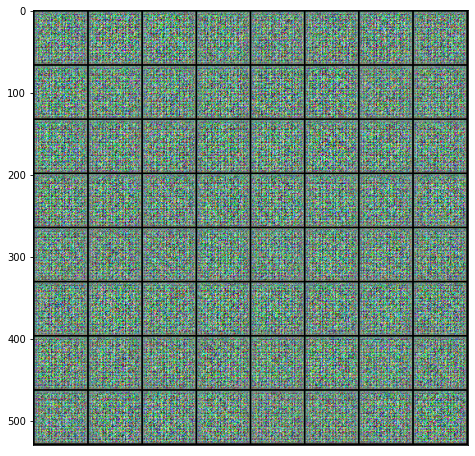

In [20]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [21]:
generator = to_device(generator, device)

In [22]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [23]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [24]:
from torchvision.utils import save_image

In [25]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [26]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [27]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

In [28]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [29]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [31]:
lr = 0.0001
epochs = 1000

In [32]:
history = fit(epochs, lr)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Epoch [1/1000], loss_g: 3.2044, loss_d: 0.5868, real_score: 0.8252, fake_score: 0.3098
Saving generated-images-0001.png



Epoch [2/1000], loss_g: 4.5836, loss_d: 0.3237, real_score: 0.8657, fake_score: 0.1578
Saving generated-images-0002.png



Epoch [3/1000], loss_g: 5.4742, loss_d: 0.1662, real_score: 0.9181, fake_score: 0.0717
Saving generated-images-0003.png



Epoch [4/1000], loss_g: 6.5847, loss_d: 0.0954, real_score: 0.9660, fake_score: 0.0580
Saving generated-images-0004.png



Epoch [5/1000], loss_g: 6.8743, loss_d: 0.0541, real_score: 0.9856, fake_score: 0.0386
Saving generated-images-0005.png



Epoch [6/1000], loss_g: 6.9746, loss_d: 0.0519, real_score: 0.9771, fake_score: 0.0268
Saving generated-images-0006.png



Epoch [7/1000], loss_g: 6.7820, loss_d: 0.0609, real_score: 0.9650, fake_score: 0.0222
Saving generated-images-0007.png



Epoch [8/1000], loss_g: 7.0039, loss_d: 0.0280, real_score: 0.9913, fake_score: 0.0189
Saving generated-images-0008.png



Epoch [9/1000], loss_g: 7.2663, loss_d: 0.0207, real_score: 0.9947, fake_score: 0.0153
Saving generated-images-0009.png



Epoch [10/1000], loss_g: 7.4022, loss_d: 0.0319, real_score: 0.9845, fake_score: 0.0158
Saving generated-images-0010.png



Epoch [11/1000], loss_g: 7.4801, loss_d: 0.0206, real_score: 0.9895, fake_score: 0.0099
Saving generated-images-0011.png



Epoch [12/1000], loss_g: 7.5429, loss_d: 0.0233, real_score: 0.9849, fake_score: 0.0070
Saving generated-images-0012.png



Epoch [13/1000], loss_g: 7.7370, loss_d: 0.0162, real_score: 0.9939, fake_score: 0.0100
Saving generated-images-0013.png



Epoch [14/1000], loss_g: 8.1623, loss_d: 0.0167, real_score: 0.9942, fake_score: 0.0107
Saving generated-images-0014.png



Epoch [15/1000], loss_g: 9.0174, loss_d: 0.0243, real_score: 0.9913, fake_score: 0.0154
Saving generated-images-0015.png



Epoch [16/1000], loss_g: 8.1068, loss_d: 0.0143, real_score: 0.9919, fake_score: 0.0060
Saving generated-images-0016.png



Epoch [17/1000], loss_g: 9.1883, loss_d: 0.0257, real_score: 0.9883, fake_score: 0.0137
Saving generated-images-0017.png



Epoch [18/1000], loss_g: 10.9974, loss_d: 0.0697, real_score: 0.9430, fake_score: 0.0000
Saving generated-images-0018.png



Epoch [19/1000], loss_g: 10.6190, loss_d: 0.0008, real_score: 0.9993, fake_score: 0.0000
Saving generated-images-0019.png



Epoch [20/1000], loss_g: 5.8929, loss_d: 0.0371, real_score: 0.9938, fake_score: 0.0301
Saving generated-images-0020.png



Epoch [21/1000], loss_g: 4.5800, loss_d: 0.0793, real_score: 0.9996, fake_score: 0.0744
Saving generated-images-0021.png



Epoch [22/1000], loss_g: 10.7170, loss_d: 1.0610, real_score: 0.9964, fake_score: 0.6413
Saving generated-images-0022.png



Epoch [23/1000], loss_g: 4.6282, loss_d: 0.0689, real_score: 0.9435, fake_score: 0.0084
Saving generated-images-0023.png



Epoch [24/1000], loss_g: 2.0197, loss_d: 0.1771, real_score: 0.9331, fake_score: 0.0957
Saving generated-images-0024.png



Epoch [25/1000], loss_g: 4.2649, loss_d: 0.4528, real_score: 0.9035, fake_score: 0.2791
Saving generated-images-0025.png



Epoch [26/1000], loss_g: 3.2011, loss_d: 0.2777, real_score: 0.9821, fake_score: 0.2219
Saving generated-images-0026.png



Epoch [27/1000], loss_g: 3.2556, loss_d: 0.2743, real_score: 0.8597, fake_score: 0.1048
Saving generated-images-0027.png



Epoch [28/1000], loss_g: 3.6393, loss_d: 0.2379, real_score: 0.9354, fake_score: 0.1503
Saving generated-images-0028.png



Epoch [29/1000], loss_g: 4.2558, loss_d: 0.2113, real_score: 0.9184, fake_score: 0.1102
Saving generated-images-0029.png



Epoch [30/1000], loss_g: 4.3554, loss_d: 0.1671, real_score: 0.9152, fake_score: 0.0707
Saving generated-images-0030.png



Epoch [31/1000], loss_g: 4.5373, loss_d: 0.2132, real_score: 0.8725, fake_score: 0.0626
Saving generated-images-0031.png



Epoch [32/1000], loss_g: 4.3707, loss_d: 0.1096, real_score: 0.9870, fake_score: 0.0894
Saving generated-images-0032.png



Epoch [33/1000], loss_g: 8.0454, loss_d: 0.5360, real_score: 0.9971, fake_score: 0.3956
Saving generated-images-0033.png



Epoch [34/1000], loss_g: 3.4455, loss_d: 0.2366, real_score: 0.9118, fake_score: 0.1240
Saving generated-images-0034.png



Epoch [35/1000], loss_g: 3.5206, loss_d: 0.0997, real_score: 0.9663, fake_score: 0.0622
Saving generated-images-0035.png



Epoch [36/1000], loss_g: 4.4657, loss_d: 0.1011, real_score: 0.9814, fake_score: 0.0779
Saving generated-images-0036.png



Epoch [37/1000], loss_g: 5.1341, loss_d: 0.1644, real_score: 0.9446, fake_score: 0.0988
Saving generated-images-0037.png



Epoch [38/1000], loss_g: 5.4077, loss_d: 0.2050, real_score: 0.9071, fake_score: 0.0861
Saving generated-images-0038.png



Epoch [39/1000], loss_g: 11.6075, loss_d: 0.3390, real_score: 0.7447, fake_score: 0.0001
Saving generated-images-0039.png



Epoch [40/1000], loss_g: 5.1196, loss_d: 0.3710, real_score: 0.9602, fake_score: 0.2392
Saving generated-images-0040.png



Epoch [41/1000], loss_g: 5.1687, loss_d: 0.3079, real_score: 0.9497, fake_score: 0.2100
Saving generated-images-0041.png



Epoch [42/1000], loss_g: 3.2059, loss_d: 0.2335, real_score: 0.8917, fake_score: 0.0917
Saving generated-images-0042.png



Epoch [43/1000], loss_g: 5.0460, loss_d: 0.4555, real_score: 0.9428, fake_score: 0.3060
Saving generated-images-0043.png



Epoch [44/1000], loss_g: 6.3165, loss_d: 1.5557, real_score: 0.9929, fake_score: 0.7483
Saving generated-images-0044.png



Epoch [45/1000], loss_g: 4.1135, loss_d: 0.5437, real_score: 0.8243, fake_score: 0.2706
Saving generated-images-0045.png



Epoch [46/1000], loss_g: 2.9531, loss_d: 0.3731, real_score: 0.8702, fake_score: 0.1808
Saving generated-images-0046.png



Epoch [47/1000], loss_g: 4.4312, loss_d: 0.6130, real_score: 0.9698, fake_score: 0.4148
Saving generated-images-0047.png



Epoch [48/1000], loss_g: 3.0908, loss_d: 0.3986, real_score: 0.8169, fake_score: 0.1599
Saving generated-images-0048.png



Epoch [49/1000], loss_g: 2.8742, loss_d: 1.8951, real_score: 0.1926, fake_score: 0.0024
Saving generated-images-0049.png



Epoch [50/1000], loss_g: 2.6235, loss_d: 0.4149, real_score: 0.7436, fake_score: 0.0619
Saving generated-images-0050.png



Epoch [51/1000], loss_g: 3.5437, loss_d: 0.4879, real_score: 0.6592, fake_score: 0.0186
Saving generated-images-0051.png



Epoch [52/1000], loss_g: 3.9304, loss_d: 0.1682, real_score: 0.8997, fake_score: 0.0572
Saving generated-images-0052.png



Epoch [53/1000], loss_g: 3.1919, loss_d: 0.3451, real_score: 0.8626, fake_score: 0.1617
Saving generated-images-0053.png



Epoch [54/1000], loss_g: 2.7325, loss_d: 0.4247, real_score: 0.7877, fake_score: 0.1513
Saving generated-images-0054.png



Epoch [55/1000], loss_g: 4.0968, loss_d: 0.2160, real_score: 0.8458, fake_score: 0.0380
Saving generated-images-0055.png



Epoch [56/1000], loss_g: 4.1756, loss_d: 0.3552, real_score: 0.9731, fake_score: 0.2700
Saving generated-images-0056.png



Epoch [57/1000], loss_g: 3.7344, loss_d: 0.2213, real_score: 0.8929, fake_score: 0.0945
Saving generated-images-0057.png



Epoch [58/1000], loss_g: 4.6674, loss_d: 0.1767, real_score: 0.8655, fake_score: 0.0262
Saving generated-images-0058.png



Epoch [59/1000], loss_g: 8.0687, loss_d: 1.2332, real_score: 0.9828, fake_score: 0.6473
Saving generated-images-0059.png



Epoch [60/1000], loss_g: 4.2803, loss_d: 0.3480, real_score: 0.8875, fake_score: 0.1880
Saving generated-images-0060.png



Epoch [61/1000], loss_g: 5.7139, loss_d: 0.4741, real_score: 0.9086, fake_score: 0.2968
Saving generated-images-0061.png



Epoch [62/1000], loss_g: 9.0832, loss_d: 0.7458, real_score: 0.9656, fake_score: 0.4900
Saving generated-images-0062.png



Epoch [63/1000], loss_g: 2.3833, loss_d: 0.5096, real_score: 0.7340, fake_score: 0.1414
Saving generated-images-0063.png



Epoch [64/1000], loss_g: 3.6234, loss_d: 0.2899, real_score: 0.8707, fake_score: 0.1313
Saving generated-images-0064.png



Epoch [65/1000], loss_g: 3.8619, loss_d: 0.3105, real_score: 0.9498, fake_score: 0.2208
Saving generated-images-0065.png



Epoch [66/1000], loss_g: 2.5134, loss_d: 0.3637, real_score: 0.7350, fake_score: 0.0406
Saving generated-images-0066.png



Epoch [67/1000], loss_g: 3.5398, loss_d: 1.1999, real_score: 0.3520, fake_score: 0.0024
Saving generated-images-0067.png



Epoch [68/1000], loss_g: 2.1426, loss_d: 0.4461, real_score: 0.7303, fake_score: 0.0893
Saving generated-images-0068.png



Epoch [69/1000], loss_g: 4.3728, loss_d: 0.2028, real_score: 0.8707, fake_score: 0.0510
Saving generated-images-0069.png



Epoch [70/1000], loss_g: 3.4505, loss_d: 0.2615, real_score: 0.8089, fake_score: 0.0304
Saving generated-images-0070.png



Epoch [71/1000], loss_g: 3.7423, loss_d: 0.6077, real_score: 0.5916, fake_score: 0.0037
Saving generated-images-0071.png



Epoch [72/1000], loss_g: 9.9076, loss_d: 2.5326, real_score: 0.9945, fake_score: 0.8971
Saving generated-images-0072.png



Epoch [73/1000], loss_g: 4.3466, loss_d: 0.4802, real_score: 0.9311, fake_score: 0.3053
Saving generated-images-0073.png



Epoch [74/1000], loss_g: 3.2951, loss_d: 0.3459, real_score: 0.8354, fake_score: 0.1410
Saving generated-images-0074.png



Epoch [75/1000], loss_g: 3.3345, loss_d: 0.2249, real_score: 0.9230, fake_score: 0.1299
Saving generated-images-0075.png



Epoch [76/1000], loss_g: 5.1639, loss_d: 0.5321, real_score: 0.9635, fake_score: 0.3710
Saving generated-images-0076.png



Epoch [77/1000], loss_g: 3.1839, loss_d: 0.2447, real_score: 0.8304, fake_score: 0.0460
Saving generated-images-0077.png



Epoch [78/1000], loss_g: 3.3607, loss_d: 0.2168, real_score: 0.9038, fake_score: 0.1027
Saving generated-images-0078.png



Epoch [79/1000], loss_g: 3.2417, loss_d: 0.2726, real_score: 0.8842, fake_score: 0.1258
Saving generated-images-0079.png



Epoch [80/1000], loss_g: 11.2257, loss_d: 1.0504, real_score: 0.9864, fake_score: 0.6135
Saving generated-images-0080.png



Epoch [81/1000], loss_g: 2.6508, loss_d: 0.4397, real_score: 0.7094, fake_score: 0.0524
Saving generated-images-0081.png



Epoch [82/1000], loss_g: 4.4191, loss_d: 0.3541, real_score: 0.8978, fake_score: 0.2026
Saving generated-images-0082.png



Epoch [83/1000], loss_g: 7.8447, loss_d: 1.1585, real_score: 0.9875, fake_score: 0.6496
Saving generated-images-0083.png



Epoch [84/1000], loss_g: 3.2466, loss_d: 0.3716, real_score: 0.7442, fake_score: 0.0499
Saving generated-images-0084.png



Epoch [85/1000], loss_g: 3.4264, loss_d: 0.2689, real_score: 0.8622, fake_score: 0.1024
Saving generated-images-0085.png



Epoch [86/1000], loss_g: 4.0072, loss_d: 0.3519, real_score: 0.9164, fake_score: 0.2147
Saving generated-images-0086.png



Epoch [87/1000], loss_g: 5.8012, loss_d: 0.5623, real_score: 0.9791, fake_score: 0.3730
Saving generated-images-0087.png



Epoch [88/1000], loss_g: 2.8990, loss_d: 0.2253, real_score: 0.9172, fake_score: 0.1187
Saving generated-images-0088.png



Epoch [89/1000], loss_g: 3.5948, loss_d: 0.3000, real_score: 0.8679, fake_score: 0.1317
Saving generated-images-0089.png



Epoch [90/1000], loss_g: 4.0801, loss_d: 2.2961, real_score: 0.1640, fake_score: 0.0006
Saving generated-images-0090.png



Epoch [91/1000], loss_g: 2.6795, loss_d: 0.4073, real_score: 0.7847, fake_score: 0.1337
Saving generated-images-0091.png



Epoch [92/1000], loss_g: 3.1526, loss_d: 0.2104, real_score: 0.8668, fake_score: 0.0582
Saving generated-images-0092.png



Epoch [93/1000], loss_g: 3.8770, loss_d: 0.2907, real_score: 0.9215, fake_score: 0.1785
Saving generated-images-0093.png



Epoch [94/1000], loss_g: 3.3534, loss_d: 0.3410, real_score: 0.8514, fake_score: 0.1477
Saving generated-images-0094.png



Epoch [95/1000], loss_g: 3.0953, loss_d: 0.2060, real_score: 0.8793, fake_score: 0.0642
Saving generated-images-0095.png



Epoch [96/1000], loss_g: 8.0932, loss_d: 1.5467, real_score: 0.9979, fake_score: 0.7172
Saving generated-images-0096.png



Epoch [97/1000], loss_g: 4.3556, loss_d: 0.4123, real_score: 0.8666, fake_score: 0.2173
Saving generated-images-0097.png



Epoch [98/1000], loss_g: 3.6811, loss_d: 0.2031, real_score: 0.9254, fake_score: 0.1116
Saving generated-images-0098.png



Epoch [99/1000], loss_g: 6.9700, loss_d: 1.1406, real_score: 0.9967, fake_score: 0.6293
Saving generated-images-0099.png



Epoch [100/1000], loss_g: 2.3867, loss_d: 0.4159, real_score: 0.7467, fake_score: 0.0768
Saving generated-images-0100.png



Epoch [101/1000], loss_g: 2.9606, loss_d: 0.3614, real_score: 0.8306, fake_score: 0.1391
Saving generated-images-0101.png



Epoch [102/1000], loss_g: 2.7346, loss_d: 0.1370, real_score: 0.9727, fake_score: 0.1001
Saving generated-images-0102.png



Epoch [103/1000], loss_g: 1.5776, loss_d: 1.5477, real_score: 0.2695, fake_score: 0.0023
Saving generated-images-0103.png



Epoch [104/1000], loss_g: 3.0390, loss_d: 0.3441, real_score: 0.8267, fake_score: 0.1322
Saving generated-images-0104.png



Epoch [105/1000], loss_g: 3.7351, loss_d: 0.1511, real_score: 0.9225, fake_score: 0.0651
Saving generated-images-0105.png



Epoch [106/1000], loss_g: 2.7219, loss_d: 0.2395, real_score: 0.8450, fake_score: 0.0606
Saving generated-images-0106.png



Epoch [107/1000], loss_g: 4.9104, loss_d: 0.4279, real_score: 0.6865, fake_score: 0.0065
Saving generated-images-0107.png



Epoch [108/1000], loss_g: 3.5432, loss_d: 0.4480, real_score: 0.8621, fake_score: 0.2343
Saving generated-images-0108.png



Epoch [109/1000], loss_g: 3.5768, loss_d: 0.3238, real_score: 0.9002, fake_score: 0.1820
Saving generated-images-0109.png



Epoch [110/1000], loss_g: 0.4582, loss_d: 1.1405, real_score: 0.3562, fake_score: 0.0080
Saving generated-images-0110.png



Epoch [111/1000], loss_g: 4.0864, loss_d: 0.4238, real_score: 0.9620, fake_score: 0.2995
Saving generated-images-0111.png



Epoch [112/1000], loss_g: 4.8165, loss_d: 0.3789, real_score: 0.9320, fake_score: 0.2523
Saving generated-images-0112.png



Epoch [113/1000], loss_g: 3.5442, loss_d: 0.4194, real_score: 0.8468, fake_score: 0.2051
Saving generated-images-0113.png



Epoch [114/1000], loss_g: 1.9919, loss_d: 1.0032, real_score: 0.4028, fake_score: 0.0030
Saving generated-images-0114.png



Epoch [115/1000], loss_g: 2.9332, loss_d: 0.2744, real_score: 0.8596, fake_score: 0.1002
Saving generated-images-0115.png



Epoch [116/1000], loss_g: 2.4927, loss_d: 0.1500, real_score: 0.9863, fake_score: 0.1212
Saving generated-images-0116.png



Epoch [117/1000], loss_g: 3.3263, loss_d: 0.3872, real_score: 0.8437, fake_score: 0.1834
Saving generated-images-0117.png



Epoch [118/1000], loss_g: 3.5647, loss_d: 0.2514, real_score: 0.8944, fake_score: 0.1179
Saving generated-images-0118.png



Epoch [119/1000], loss_g: 3.7386, loss_d: 0.2219, real_score: 0.8751, fake_score: 0.0759
Saving generated-images-0119.png



Epoch [120/1000], loss_g: 3.0707, loss_d: 0.3557, real_score: 0.9898, fake_score: 0.2635
Saving generated-images-0120.png



Epoch [121/1000], loss_g: 3.0074, loss_d: 1.3401, real_score: 0.3104, fake_score: 0.0014
Saving generated-images-0121.png



Epoch [122/1000], loss_g: 3.3541, loss_d: 0.2810, real_score: 0.9054, fake_score: 0.1581
Saving generated-images-0122.png



Epoch [123/1000], loss_g: 7.5333, loss_d: 0.7885, real_score: 0.9745, fake_score: 0.4849
Saving generated-images-0123.png



Epoch [124/1000], loss_g: 3.8156, loss_d: 0.3827, real_score: 0.9041, fake_score: 0.2247
Saving generated-images-0124.png



Epoch [125/1000], loss_g: 4.1357, loss_d: 0.3293, real_score: 0.9113, fake_score: 0.1963
Saving generated-images-0125.png



Epoch [126/1000], loss_g: 3.7850, loss_d: 0.3267, real_score: 0.9013, fake_score: 0.1854
Saving generated-images-0126.png



Epoch [127/1000], loss_g: 2.4109, loss_d: 0.3186, real_score: 0.9369, fake_score: 0.2009
Saving generated-images-0127.png



Epoch [128/1000], loss_g: 4.6369, loss_d: 0.3348, real_score: 0.9244, fake_score: 0.2014
Saving generated-images-0128.png



Epoch [129/1000], loss_g: 3.4654, loss_d: 0.3126, real_score: 0.8014, fake_score: 0.0668
Saving generated-images-0129.png



Epoch [130/1000], loss_g: 3.1918, loss_d: 0.2571, real_score: 0.8701, fake_score: 0.1009
Saving generated-images-0130.png



Epoch [131/1000], loss_g: 6.6603, loss_d: 0.5971, real_score: 0.9588, fake_score: 0.3899
Saving generated-images-0131.png



Epoch [132/1000], loss_g: 7.8178, loss_d: 0.9979, real_score: 0.9717, fake_score: 0.5839
Saving generated-images-0132.png



Epoch [133/1000], loss_g: 2.5336, loss_d: 0.4869, real_score: 0.7095, fake_score: 0.0918
Saving generated-images-0133.png



Epoch [134/1000], loss_g: 2.3750, loss_d: 0.3981, real_score: 0.8195, fake_score: 0.1574
Saving generated-images-0134.png



Epoch [135/1000], loss_g: 3.4278, loss_d: 0.2891, real_score: 0.8634, fake_score: 0.1234
Saving generated-images-0135.png



Epoch [136/1000], loss_g: 3.1859, loss_d: 0.3883, real_score: 0.8794, fake_score: 0.2117
Saving generated-images-0136.png



Epoch [137/1000], loss_g: 3.8930, loss_d: 0.2293, real_score: 0.9513, fake_score: 0.1589
Saving generated-images-0137.png



Epoch [138/1000], loss_g: 3.6327, loss_d: 0.3245, real_score: 0.9580, fake_score: 0.2297
Saving generated-images-0138.png



Epoch [139/1000], loss_g: 1.0786, loss_d: 0.4602, real_score: 0.6913, fake_score: 0.0620
Saving generated-images-0139.png



Epoch [140/1000], loss_g: 2.6297, loss_d: 0.3943, real_score: 0.7347, fake_score: 0.0539
Saving generated-images-0140.png



Epoch [141/1000], loss_g: 2.9732, loss_d: 0.2921, real_score: 0.9661, fake_score: 0.2103
Saving generated-images-0141.png



Epoch [142/1000], loss_g: 1.9466, loss_d: 0.5775, real_score: 0.6071, fake_score: 0.0348
Saving generated-images-0142.png



Epoch [143/1000], loss_g: 2.8673, loss_d: 0.3260, real_score: 0.7753, fake_score: 0.0456
Saving generated-images-0143.png



Epoch [144/1000], loss_g: 2.7754, loss_d: 0.7006, real_score: 0.5518, fake_score: 0.0127
Saving generated-images-0144.png



Epoch [145/1000], loss_g: 5.1461, loss_d: 0.4363, real_score: 0.9568, fake_score: 0.3074
Saving generated-images-0145.png



Epoch [146/1000], loss_g: 2.0552, loss_d: 0.3348, real_score: 0.8104, fake_score: 0.0928
Saving generated-images-0146.png



Epoch [147/1000], loss_g: 2.7701, loss_d: 0.3094, real_score: 0.7943, fake_score: 0.0581
Saving generated-images-0147.png



Epoch [148/1000], loss_g: 2.7108, loss_d: 0.3359, real_score: 0.8588, fake_score: 0.1529
Saving generated-images-0148.png



Epoch [149/1000], loss_g: 2.8855, loss_d: 0.2286, real_score: 0.8534, fake_score: 0.0587
Saving generated-images-0149.png



Epoch [150/1000], loss_g: 1.3451, loss_d: 1.2874, real_score: 0.3253, fake_score: 0.0040
Saving generated-images-0150.png



Epoch [151/1000], loss_g: 3.4512, loss_d: 0.3278, real_score: 0.9101, fake_score: 0.1927
Saving generated-images-0151.png



Epoch [152/1000], loss_g: 2.1767, loss_d: 0.4922, real_score: 0.6563, fake_score: 0.0336
Saving generated-images-0152.png



Epoch [153/1000], loss_g: 3.2888, loss_d: 0.4152, real_score: 0.8229, fake_score: 0.1805
Saving generated-images-0153.png



Epoch [154/1000], loss_g: 7.4421, loss_d: 1.1198, real_score: 0.9932, fake_score: 0.6087
Saving generated-images-0154.png



Epoch [155/1000], loss_g: 3.0882, loss_d: 0.3754, real_score: 0.8606, fake_score: 0.1879
Saving generated-images-0155.png



Epoch [156/1000], loss_g: 3.7066, loss_d: 0.3151, real_score: 0.9187, fake_score: 0.1953
Saving generated-images-0156.png



Epoch [157/1000], loss_g: 3.3768, loss_d: 1.8076, real_score: 0.2201, fake_score: 0.0015
Saving generated-images-0157.png



Epoch [158/1000], loss_g: 5.9861, loss_d: 1.0457, real_score: 0.9764, fake_score: 0.5935
Saving generated-images-0158.png



Epoch [159/1000], loss_g: 2.7576, loss_d: 0.3475, real_score: 0.7823, fake_score: 0.0805
Saving generated-images-0159.png



Epoch [160/1000], loss_g: 3.0895, loss_d: 0.2611, real_score: 0.8668, fake_score: 0.1011
Saving generated-images-0160.png



Epoch [161/1000], loss_g: 2.3990, loss_d: 0.3031, real_score: 0.8277, fake_score: 0.0986
Saving generated-images-0161.png



Epoch [162/1000], loss_g: 3.5385, loss_d: 0.3247, real_score: 0.9503, fake_score: 0.2249
Saving generated-images-0162.png



Epoch [163/1000], loss_g: 8.1115, loss_d: 0.9633, real_score: 0.9740, fake_score: 0.5748
Saving generated-images-0163.png



Epoch [164/1000], loss_g: 2.9215, loss_d: 0.3220, real_score: 0.8512, fake_score: 0.1376
Saving generated-images-0164.png



Epoch [165/1000], loss_g: 1.8277, loss_d: 0.9915, real_score: 0.4067, fake_score: 0.0116
Saving generated-images-0165.png



Epoch [166/1000], loss_g: 2.8542, loss_d: 0.4010, real_score: 0.8463, fake_score: 0.1925
Saving generated-images-0166.png



Epoch [167/1000], loss_g: 1.4230, loss_d: 0.4669, real_score: 0.6825, fake_score: 0.0521
Saving generated-images-0167.png



Epoch [168/1000], loss_g: 3.6492, loss_d: 0.2139, real_score: 0.8781, fake_score: 0.0748
Saving generated-images-0168.png



Epoch [169/1000], loss_g: 2.9461, loss_d: 0.2732, real_score: 0.8688, fake_score: 0.1152
Saving generated-images-0169.png



Epoch [170/1000], loss_g: 4.0148, loss_d: 0.3638, real_score: 0.9190, fake_score: 0.2314
Saving generated-images-0170.png



Epoch [171/1000], loss_g: 1.6403, loss_d: 0.4586, real_score: 0.6743, fake_score: 0.0350
Saving generated-images-0171.png



Epoch [172/1000], loss_g: 2.6262, loss_d: 0.2395, real_score: 0.8597, fake_score: 0.0764
Saving generated-images-0172.png



Epoch [173/1000], loss_g: 2.0112, loss_d: 0.4120, real_score: 0.7045, fake_score: 0.0348
Saving generated-images-0173.png



Epoch [174/1000], loss_g: 4.3022, loss_d: 0.3701, real_score: 0.9187, fake_score: 0.2330
Saving generated-images-0174.png



Epoch [175/1000], loss_g: 2.7559, loss_d: 0.3289, real_score: 0.7554, fake_score: 0.0344
Saving generated-images-0175.png



Epoch [176/1000], loss_g: 2.7784, loss_d: 0.2260, real_score: 0.8501, fake_score: 0.0557
Saving generated-images-0176.png



Epoch [177/1000], loss_g: 3.6097, loss_d: 0.4326, real_score: 0.9861, fake_score: 0.3086
Saving generated-images-0177.png



Epoch [178/1000], loss_g: 2.7237, loss_d: 0.3275, real_score: 0.7862, fake_score: 0.0641
Saving generated-images-0178.png



Epoch [179/1000], loss_g: 3.0395, loss_d: 0.2938, real_score: 0.8569, fake_score: 0.1184
Saving generated-images-0179.png



Epoch [180/1000], loss_g: 1.5115, loss_d: 0.4335, real_score: 0.7411, fake_score: 0.0958
Saving generated-images-0180.png



Epoch [181/1000], loss_g: 2.8013, loss_d: 0.3100, real_score: 0.8122, fake_score: 0.0829
Saving generated-images-0181.png



Epoch [182/1000], loss_g: 2.4988, loss_d: 0.3326, real_score: 0.8433, fake_score: 0.1385
Saving generated-images-0182.png



Epoch [183/1000], loss_g: 2.6059, loss_d: 0.2665, real_score: 0.8250, fake_score: 0.0587
Saving generated-images-0183.png



Epoch [184/1000], loss_g: 2.9170, loss_d: 0.2479, real_score: 0.8885, fake_score: 0.1148
Saving generated-images-0184.png



Epoch [185/1000], loss_g: 5.2238, loss_d: 0.3274, real_score: 0.9551, fake_score: 0.2339
Saving generated-images-0185.png



Epoch [186/1000], loss_g: 4.0096, loss_d: 0.3256, real_score: 0.9472, fake_score: 0.2244
Saving generated-images-0186.png



Epoch [187/1000], loss_g: 2.9118, loss_d: 0.3403, real_score: 0.8430, fake_score: 0.1395
Saving generated-images-0187.png



Epoch [188/1000], loss_g: 6.2953, loss_d: 1.1499, real_score: 0.9932, fake_score: 0.6199
Saving generated-images-0188.png



Epoch [189/1000], loss_g: 3.2438, loss_d: 0.2986, real_score: 0.8541, fake_score: 0.1165
Saving generated-images-0189.png



Epoch [190/1000], loss_g: 2.8209, loss_d: 0.2814, real_score: 0.8362, fake_score: 0.0808
Saving generated-images-0190.png



Epoch [191/1000], loss_g: 2.3588, loss_d: 0.2840, real_score: 0.8265, fake_score: 0.0801
Saving generated-images-0191.png



Epoch [192/1000], loss_g: 2.0371, loss_d: 0.2587, real_score: 0.8253, fake_score: 0.0515
Saving generated-images-0192.png



Epoch [193/1000], loss_g: 2.5719, loss_d: 0.2961, real_score: 0.7841, fake_score: 0.0402
Saving generated-images-0193.png



Epoch [194/1000], loss_g: 7.5544, loss_d: 0.8398, real_score: 0.9839, fake_score: 0.5068
Saving generated-images-0194.png



Epoch [195/1000], loss_g: 3.2093, loss_d: 0.3053, real_score: 0.9128, fake_score: 0.1781
Saving generated-images-0195.png



Epoch [196/1000], loss_g: 2.8070, loss_d: 0.2855, real_score: 0.8133, fake_score: 0.0655
Saving generated-images-0196.png



Epoch [197/1000], loss_g: 2.8012, loss_d: 0.3773, real_score: 0.8528, fake_score: 0.1845
Saving generated-images-0197.png



Epoch [198/1000], loss_g: 2.3959, loss_d: 0.2951, real_score: 0.8498, fake_score: 0.1152
Saving generated-images-0198.png



Epoch [199/1000], loss_g: 2.8104, loss_d: 0.2513, real_score: 0.8315, fake_score: 0.0548
Saving generated-images-0199.png



Epoch [200/1000], loss_g: 7.9102, loss_d: 0.7621, real_score: 0.9885, fake_score: 0.4828
Saving generated-images-0200.png



Epoch [201/1000], loss_g: 2.6271, loss_d: 0.2799, real_score: 0.8649, fake_score: 0.1110
Saving generated-images-0201.png



Epoch [202/1000], loss_g: 5.8794, loss_d: 0.7958, real_score: 0.9615, fake_score: 0.4854
Saving generated-images-0202.png



Epoch [203/1000], loss_g: 3.0623, loss_d: 0.2591, real_score: 0.8786, fake_score: 0.1086
Saving generated-images-0203.png



Epoch [204/1000], loss_g: 4.4710, loss_d: 0.3805, real_score: 0.9555, fake_score: 0.2676
Saving generated-images-0204.png



Epoch [205/1000], loss_g: 2.3753, loss_d: 0.2627, real_score: 0.8214, fake_score: 0.0559
Saving generated-images-0205.png



Epoch [206/1000], loss_g: 2.1435, loss_d: 0.2709, real_score: 0.8225, fake_score: 0.0654
Saving generated-images-0206.png



Epoch [207/1000], loss_g: 2.3683, loss_d: 0.1881, real_score: 0.8887, fake_score: 0.0623
Saving generated-images-0207.png



Epoch [208/1000], loss_g: 3.5959, loss_d: 0.2009, real_score: 0.9238, fake_score: 0.1076
Saving generated-images-0208.png



Epoch [209/1000], loss_g: 1.1686, loss_d: 3.9337, real_score: 0.0253, fake_score: 0.0004
Saving generated-images-0209.png



Epoch [210/1000], loss_g: 4.0875, loss_d: 0.2910, real_score: 0.8072, fake_score: 0.0568
Saving generated-images-0210.png



Epoch [211/1000], loss_g: 3.7743, loss_d: 0.3156, real_score: 0.8937, fake_score: 0.1671
Saving generated-images-0211.png



Epoch [212/1000], loss_g: 2.5110, loss_d: 0.3372, real_score: 0.8539, fake_score: 0.1441
Saving generated-images-0212.png



Epoch [213/1000], loss_g: 2.2023, loss_d: 0.3280, real_score: 0.8120, fake_score: 0.1022
Saving generated-images-0213.png



Epoch [214/1000], loss_g: 3.6610, loss_d: 0.1893, real_score: 0.9302, fake_score: 0.1058
Saving generated-images-0214.png



Epoch [215/1000], loss_g: 4.4346, loss_d: 0.3485, real_score: 0.9306, fake_score: 0.2264
Saving generated-images-0215.png



Epoch [216/1000], loss_g: 2.9829, loss_d: 0.2298, real_score: 0.8818, fake_score: 0.0923
Saving generated-images-0216.png



Epoch [217/1000], loss_g: 6.6759, loss_d: 0.7107, real_score: 0.9860, fake_score: 0.4658
Saving generated-images-0217.png



Epoch [218/1000], loss_g: 2.6386, loss_d: 0.2678, real_score: 0.8150, fake_score: 0.0475
Saving generated-images-0218.png



Epoch [219/1000], loss_g: 2.6290, loss_d: 0.2536, real_score: 0.8320, fake_score: 0.0602
Saving generated-images-0219.png



Epoch [220/1000], loss_g: 1.8033, loss_d: 0.3155, real_score: 0.7865, fake_score: 0.0546
Saving generated-images-0220.png



Epoch [221/1000], loss_g: 3.1814, loss_d: 0.2249, real_score: 0.8329, fake_score: 0.0293
Saving generated-images-0221.png



Epoch [222/1000], loss_g: 3.2195, loss_d: 0.2134, real_score: 0.8734, fake_score: 0.0694
Saving generated-images-0222.png



Epoch [223/1000], loss_g: 4.1666, loss_d: 0.3084, real_score: 0.9406, fake_score: 0.2058
Saving generated-images-0223.png



Epoch [224/1000], loss_g: 3.2713, loss_d: 0.2106, real_score: 0.9113, fake_score: 0.1062
Saving generated-images-0224.png



Epoch [225/1000], loss_g: 2.9149, loss_d: 0.2419, real_score: 0.8657, fake_score: 0.0859
Saving generated-images-0225.png



Epoch [226/1000], loss_g: 4.4402, loss_d: 0.2939, real_score: 0.9519, fake_score: 0.1997
Saving generated-images-0226.png



Epoch [227/1000], loss_g: 4.0584, loss_d: 0.2335, real_score: 0.9436, fake_score: 0.1537
Saving generated-images-0227.png



Epoch [228/1000], loss_g: 3.3008, loss_d: 0.1596, real_score: 0.9148, fake_score: 0.0656
Saving generated-images-0228.png



Epoch [229/1000], loss_g: 3.0732, loss_d: 3.3458, real_score: 0.0510, fake_score: 0.0002
Saving generated-images-0229.png



Epoch [230/1000], loss_g: 2.2754, loss_d: 0.4884, real_score: 0.7229, fake_score: 0.1069
Saving generated-images-0230.png



Epoch [231/1000], loss_g: 1.3995, loss_d: 0.6445, real_score: 0.6020, fake_score: 0.0441
Saving generated-images-0231.png



Epoch [232/1000], loss_g: 3.7646, loss_d: 0.4690, real_score: 0.8861, fake_score: 0.2572
Saving generated-images-0232.png



Epoch [233/1000], loss_g: 2.6899, loss_d: 0.2425, real_score: 0.9048, fake_score: 0.1237
Saving generated-images-0233.png



Epoch [234/1000], loss_g: 2.2512, loss_d: 0.2871, real_score: 0.8216, fake_score: 0.0765
Saving generated-images-0234.png



Epoch [235/1000], loss_g: 1.9907, loss_d: 0.3485, real_score: 0.7535, fake_score: 0.0440
Saving generated-images-0235.png



Epoch [236/1000], loss_g: 3.6958, loss_d: 0.1684, real_score: 0.8984, fake_score: 0.0554
Saving generated-images-0236.png



Epoch [237/1000], loss_g: 3.3076, loss_d: 0.2766, real_score: 0.9123, fake_score: 0.1587
Saving generated-images-0237.png



Epoch [238/1000], loss_g: 4.0696, loss_d: 0.2797, real_score: 0.9643, fake_score: 0.2061
Saving generated-images-0238.png



Epoch [239/1000], loss_g: 2.6783, loss_d: 0.1810, real_score: 0.8822, fake_score: 0.0505
Saving generated-images-0239.png



Epoch [240/1000], loss_g: 3.4895, loss_d: 0.1993, real_score: 0.9095, fake_score: 0.0944
Saving generated-images-0240.png



Epoch [241/1000], loss_g: 3.4867, loss_d: 0.1654, real_score: 0.9355, fake_score: 0.0891
Saving generated-images-0241.png



Epoch [242/1000], loss_g: 3.0122, loss_d: 0.2088, real_score: 0.8694, fake_score: 0.0621
Saving generated-images-0242.png



Epoch [243/1000], loss_g: 1.6605, loss_d: 0.2318, real_score: 0.8429, fake_score: 0.0547
Saving generated-images-0243.png



Epoch [244/1000], loss_g: 2.0417, loss_d: 0.4791, real_score: 0.6984, fake_score: 0.0516
Saving generated-images-0244.png



Epoch [245/1000], loss_g: 4.1725, loss_d: 0.3406, real_score: 0.9220, fake_score: 0.2095
Saving generated-images-0245.png



Epoch [246/1000], loss_g: 2.5518, loss_d: 0.3041, real_score: 0.8272, fake_score: 0.0907
Saving generated-images-0246.png



Epoch [247/1000], loss_g: 1.4019, loss_d: 0.4419, real_score: 0.7008, fake_score: 0.0591
Saving generated-images-0247.png



Epoch [248/1000], loss_g: 3.6494, loss_d: 0.2035, real_score: 0.9528, fake_score: 0.1362
Saving generated-images-0248.png



Epoch [249/1000], loss_g: 2.6855, loss_d: 0.2577, real_score: 0.8417, fake_score: 0.0741
Saving generated-images-0249.png



Epoch [250/1000], loss_g: 2.6136, loss_d: 0.2518, real_score: 0.8658, fake_score: 0.0963
Saving generated-images-0250.png



Epoch [251/1000], loss_g: 2.4279, loss_d: 0.2874, real_score: 0.8329, fake_score: 0.0894
Saving generated-images-0251.png



Epoch [252/1000], loss_g: 2.9976, loss_d: 0.1827, real_score: 0.8981, fake_score: 0.0686
Saving generated-images-0252.png



Epoch [253/1000], loss_g: 2.7627, loss_d: 0.2113, real_score: 0.8866, fake_score: 0.0796
Saving generated-images-0253.png



Epoch [254/1000], loss_g: 3.5723, loss_d: 0.1987, real_score: 0.9503, fake_score: 0.1320
Saving generated-images-0254.png



Epoch [255/1000], loss_g: 2.9027, loss_d: 0.2032, real_score: 0.9475, fake_score: 0.1326
Saving generated-images-0255.png



Epoch [256/1000], loss_g: 3.7501, loss_d: 0.2448, real_score: 0.9259, fake_score: 0.1474
Saving generated-images-0256.png



Epoch [257/1000], loss_g: 2.6381, loss_d: 0.2286, real_score: 0.8498, fake_score: 0.0565
Saving generated-images-0257.png



Epoch [258/1000], loss_g: 2.7105, loss_d: 0.1968, real_score: 0.8768, fake_score: 0.0579
Saving generated-images-0258.png



Epoch [259/1000], loss_g: 3.1304, loss_d: 0.1619, real_score: 0.9053, fake_score: 0.0570
Saving generated-images-0259.png



Epoch [260/1000], loss_g: 4.4025, loss_d: 0.2950, real_score: 0.9320, fake_score: 0.1884
Saving generated-images-0260.png



Epoch [261/1000], loss_g: 3.1706, loss_d: 0.1497, real_score: 0.9243, fake_score: 0.0654
Saving generated-images-0261.png



Epoch [262/1000], loss_g: 0.3019, loss_d: 0.7592, real_score: 0.5096, fake_score: 0.0087
Saving generated-images-0262.png



Epoch [263/1000], loss_g: 1.1706, loss_d: 0.7200, real_score: 0.5708, fake_score: 0.0643
Saving generated-images-0263.png



Epoch [264/1000], loss_g: 2.9383, loss_d: 0.4000, real_score: 0.8421, fake_score: 0.1760
Saving generated-images-0264.png



Epoch [265/1000], loss_g: 2.6689, loss_d: 0.2866, real_score: 0.8282, fake_score: 0.0814
Saving generated-images-0265.png



Epoch [266/1000], loss_g: 3.4735, loss_d: 0.2023, real_score: 0.9041, fake_score: 0.0878
Saving generated-images-0266.png



Epoch [267/1000], loss_g: 2.6618, loss_d: 0.2166, real_score: 0.8525, fake_score: 0.0481
Saving generated-images-0267.png



Epoch [268/1000], loss_g: 3.0223, loss_d: 0.2021, real_score: 0.8978, fake_score: 0.0846
Saving generated-images-0268.png



Epoch [269/1000], loss_g: 2.8888, loss_d: 0.1872, real_score: 0.8952, fake_score: 0.0707
Saving generated-images-0269.png



Epoch [270/1000], loss_g: 2.7476, loss_d: 0.2084, real_score: 0.8892, fake_score: 0.0795
Saving generated-images-0270.png



Epoch [271/1000], loss_g: 3.1809, loss_d: 0.1526, real_score: 0.9074, fake_score: 0.0514
Saving generated-images-0271.png



Epoch [272/1000], loss_g: 3.0451, loss_d: 0.1684, real_score: 0.8822, fake_score: 0.0391
Saving generated-images-0272.png



Epoch [273/1000], loss_g: 3.3197, loss_d: 0.1339, real_score: 0.9451, fake_score: 0.0720
Saving generated-images-0273.png



Epoch [274/1000], loss_g: 3.6400, loss_d: 0.1530, real_score: 0.9475, fake_score: 0.0916
Saving generated-images-0274.png



Epoch [275/1000], loss_g: 3.0949, loss_d: 0.1762, real_score: 0.9288, fake_score: 0.0936
Saving generated-images-0275.png



Epoch [276/1000], loss_g: 3.1548, loss_d: 0.1058, real_score: 0.9389, fake_score: 0.0402
Saving generated-images-0276.png



Epoch [277/1000], loss_g: 3.5260, loss_d: 0.1596, real_score: 0.9394, fake_score: 0.0888
Saving generated-images-0277.png



Epoch [278/1000], loss_g: 2.8465, loss_d: 0.1327, real_score: 0.9074, fake_score: 0.0335
Saving generated-images-0278.png



Epoch [279/1000], loss_g: 3.4522, loss_d: 0.3330, real_score: 0.9723, fake_score: 0.2371
Saving generated-images-0279.png



Epoch [280/1000], loss_g: 2.8406, loss_d: 0.2469, real_score: 0.8808, fake_score: 0.1030
Saving generated-images-0280.png



Epoch [281/1000], loss_g: 2.3994, loss_d: 0.2626, real_score: 0.8541, fake_score: 0.0910
Saving generated-images-0281.png



Epoch [282/1000], loss_g: 3.3276, loss_d: 0.1656, real_score: 0.9104, fake_score: 0.0657
Saving generated-images-0282.png



Epoch [283/1000], loss_g: 3.5747, loss_d: 0.2197, real_score: 0.9366, fake_score: 0.1383
Saving generated-images-0283.png



Epoch [284/1000], loss_g: 2.8724, loss_d: 0.2090, real_score: 0.8546, fake_score: 0.0448
Saving generated-images-0284.png



Epoch [285/1000], loss_g: 3.2480, loss_d: 0.1589, real_score: 0.9241, fake_score: 0.0717
Saving generated-images-0285.png



Epoch [286/1000], loss_g: 2.9895, loss_d: 0.1629, real_score: 0.9030, fake_score: 0.0567
Saving generated-images-0286.png



Epoch [287/1000], loss_g: 3.3637, loss_d: 0.1780, real_score: 0.9407, fake_score: 0.1052
Saving generated-images-0287.png



Epoch [288/1000], loss_g: 2.1218, loss_d: 0.2141, real_score: 0.8345, fake_score: 0.0281
Saving generated-images-0288.png



Epoch [289/1000], loss_g: 3.4605, loss_d: 0.1217, real_score: 0.9248, fake_score: 0.0403
Saving generated-images-0289.png



Epoch [290/1000], loss_g: 2.7256, loss_d: 0.1696, real_score: 0.8920, fake_score: 0.0506
Saving generated-images-0290.png



Epoch [291/1000], loss_g: 3.1857, loss_d: 0.1556, real_score: 0.9030, fake_score: 0.0496
Saving generated-images-0291.png



Epoch [292/1000], loss_g: 3.3070, loss_d: 0.1242, real_score: 0.9576, fake_score: 0.0755
Saving generated-images-0292.png



Epoch [293/1000], loss_g: 2.5389, loss_d: 0.1941, real_score: 0.8706, fake_score: 0.0499
Saving generated-images-0293.png



Epoch [294/1000], loss_g: 3.0156, loss_d: 0.1486, real_score: 0.9304, fake_score: 0.0709
Saving generated-images-0294.png



Epoch [295/1000], loss_g: 3.0051, loss_d: 0.1694, real_score: 0.9261, fake_score: 0.0851
Saving generated-images-0295.png



Epoch [296/1000], loss_g: 3.0831, loss_d: 0.1304, real_score: 0.9419, fake_score: 0.0659
Saving generated-images-0296.png



Epoch [297/1000], loss_g: 3.8368, loss_d: 0.0995, real_score: 0.9550, fake_score: 0.0509
Saving generated-images-0297.png



Epoch [298/1000], loss_g: 2.1842, loss_d: 0.1750, real_score: 0.8924, fake_score: 0.0565
Saving generated-images-0298.png



Epoch [299/1000], loss_g: 0.7807, loss_d: 1.4608, real_score: 0.3076, fake_score: 0.0397
Saving generated-images-0299.png



Epoch [300/1000], loss_g: 3.3531, loss_d: 0.3881, real_score: 0.8612, fake_score: 0.1911
Saving generated-images-0300.png



Epoch [301/1000], loss_g: 2.3272, loss_d: 0.3710, real_score: 0.7984, fake_score: 0.1160
Saving generated-images-0301.png



Epoch [302/1000], loss_g: 3.2970, loss_d: 0.2087, real_score: 0.9076, fake_score: 0.0996
Saving generated-images-0302.png



Epoch [303/1000], loss_g: 3.0949, loss_d: 0.1694, real_score: 0.9021, fake_score: 0.0597
Saving generated-images-0303.png



Epoch [304/1000], loss_g: 3.3826, loss_d: 0.1491, real_score: 0.9429, fake_score: 0.0829
Saving generated-images-0304.png



Epoch [305/1000], loss_g: 3.0289, loss_d: 0.1254, real_score: 0.9477, fake_score: 0.0675
Saving generated-images-0305.png



Epoch [306/1000], loss_g: 2.8637, loss_d: 0.1635, real_score: 0.8963, fake_score: 0.0498
Saving generated-images-0306.png



Epoch [307/1000], loss_g: 3.5580, loss_d: 0.1189, real_score: 0.9537, fake_score: 0.0669
Saving generated-images-0307.png



Epoch [308/1000], loss_g: 3.2949, loss_d: 0.1215, real_score: 0.9261, fake_score: 0.0422
Saving generated-images-0308.png



Epoch [309/1000], loss_g: 3.3653, loss_d: 0.1299, real_score: 0.9402, fake_score: 0.0640
Saving generated-images-0309.png



Epoch [310/1000], loss_g: 2.9236, loss_d: 0.1221, real_score: 0.9289, fake_score: 0.0450
Saving generated-images-0310.png



Epoch [311/1000], loss_g: 3.9971, loss_d: 0.1320, real_score: 0.9605, fake_score: 0.0849
Saving generated-images-0311.png



Epoch [312/1000], loss_g: 2.6789, loss_d: 0.1315, real_score: 0.9184, fake_score: 0.0434
Saving generated-images-0312.png



Epoch [313/1000], loss_g: 3.5432, loss_d: 0.1066, real_score: 0.9557, fake_score: 0.0580
Saving generated-images-0313.png



Epoch [314/1000], loss_g: 2.3872, loss_d: 0.1598, real_score: 0.8867, fake_score: 0.0369
Saving generated-images-0314.png



Epoch [315/1000], loss_g: 3.5896, loss_d: 0.1224, real_score: 0.9532, fake_score: 0.0696
Saving generated-images-0315.png



Epoch [316/1000], loss_g: 2.2691, loss_d: 0.1620, real_score: 0.8877, fake_score: 0.0388
Saving generated-images-0316.png



Epoch [317/1000], loss_g: 2.5715, loss_d: 1.4943, real_score: 0.9475, fake_score: 0.6499
Saving generated-images-0317.png



Epoch [318/1000], loss_g: 3.4172, loss_d: 0.6271, real_score: 0.8638, fake_score: 0.3502
Saving generated-images-0318.png



Epoch [319/1000], loss_g: 3.4073, loss_d: 0.4248, real_score: 0.8792, fake_score: 0.2305
Saving generated-images-0319.png



Epoch [320/1000], loss_g: 2.9270, loss_d: 0.2434, real_score: 0.8671, fake_score: 0.0876
Saving generated-images-0320.png



Epoch [321/1000], loss_g: 2.7753, loss_d: 0.1906, real_score: 0.9031, fake_score: 0.0799
Saving generated-images-0321.png



Epoch [322/1000], loss_g: 2.9747, loss_d: 0.1821, real_score: 0.9125, fake_score: 0.0779
Saving generated-images-0322.png



Epoch [323/1000], loss_g: 2.9490, loss_d: 0.1773, real_score: 0.8974, fake_score: 0.0631
Saving generated-images-0323.png



Epoch [324/1000], loss_g: 3.1334, loss_d: 0.1505, real_score: 0.9333, fake_score: 0.0757
Saving generated-images-0324.png



Epoch [325/1000], loss_g: 3.2581, loss_d: 0.1271, real_score: 0.9467, fake_score: 0.0671
Saving generated-images-0325.png



Epoch [326/1000], loss_g: 2.9568, loss_d: 0.1349, real_score: 0.9321, fake_score: 0.0598
Saving generated-images-0326.png



Epoch [327/1000], loss_g: 3.2603, loss_d: 0.1249, real_score: 0.9443, fake_score: 0.0638
Saving generated-images-0327.png



Epoch [328/1000], loss_g: 3.3927, loss_d: 0.1161, real_score: 0.9459, fake_score: 0.0567
Saving generated-images-0328.png



Epoch [329/1000], loss_g: 3.1827, loss_d: 0.1136, real_score: 0.9385, fake_score: 0.0477
Saving generated-images-0329.png



Epoch [330/1000], loss_g: 3.5165, loss_d: 0.1203, real_score: 0.9542, fake_score: 0.0688
Saving generated-images-0330.png



Epoch [331/1000], loss_g: 3.1166, loss_d: 0.1306, real_score: 0.9235, fake_score: 0.0480
Saving generated-images-0331.png



Epoch [332/1000], loss_g: 3.3916, loss_d: 0.1136, real_score: 0.9519, fake_score: 0.0609
Saving generated-images-0332.png



Epoch [333/1000], loss_g: 3.8330, loss_d: 0.0957, real_score: 0.9664, fake_score: 0.0583
Saving generated-images-0333.png



Epoch [334/1000], loss_g: 2.6718, loss_d: 0.1438, real_score: 0.9143, fake_score: 0.0509
Saving generated-images-0334.png



Epoch [335/1000], loss_g: 4.0537, loss_d: 0.0995, real_score: 0.9673, fake_score: 0.0628
Saving generated-images-0335.png



Epoch [336/1000], loss_g: 3.1997, loss_d: 0.1204, real_score: 0.9376, fake_score: 0.0529
Saving generated-images-0336.png



Epoch [337/1000], loss_g: 3.3112, loss_d: 0.0973, real_score: 0.9494, fake_score: 0.0432
Saving generated-images-0337.png



Epoch [338/1000], loss_g: 3.6625, loss_d: 0.0867, real_score: 0.9614, fake_score: 0.0453
Saving generated-images-0338.png



Epoch [339/1000], loss_g: 3.3749, loss_d: 0.0908, real_score: 0.9529, fake_score: 0.0410
Saving generated-images-0339.png



Epoch [340/1000], loss_g: 3.2408, loss_d: 0.1111, real_score: 0.9426, fake_score: 0.0492
Saving generated-images-0340.png



Epoch [341/1000], loss_g: 3.5245, loss_d: 0.0938, real_score: 0.9513, fake_score: 0.0418
Saving generated-images-0341.png



Epoch [342/1000], loss_g: 3.5765, loss_d: 0.0914, real_score: 0.9535, fake_score: 0.0419
Saving generated-images-0342.png



Epoch [343/1000], loss_g: 3.7450, loss_d: 0.0884, real_score: 0.9546, fake_score: 0.0402
Saving generated-images-0343.png



Epoch [344/1000], loss_g: 3.4546, loss_d: 0.0989, real_score: 0.9511, fake_score: 0.0463
Saving generated-images-0344.png



Epoch [345/1000], loss_g: 3.2702, loss_d: 0.1101, real_score: 0.9241, fake_score: 0.0298
Saving generated-images-0345.png



Epoch [346/1000], loss_g: 3.7779, loss_d: 0.0953, real_score: 0.9568, fake_score: 0.0486
Saving generated-images-0346.png



Epoch [347/1000], loss_g: 4.0172, loss_d: 0.0949, real_score: 0.9712, fake_score: 0.0621
Saving generated-images-0347.png



Epoch [348/1000], loss_g: 2.7412, loss_d: 0.1130, real_score: 0.9200, fake_score: 0.0279
Saving generated-images-0348.png



Epoch [349/1000], loss_g: 3.9675, loss_d: 0.0862, real_score: 0.9551, fake_score: 0.0384
Saving generated-images-0349.png



Epoch [350/1000], loss_g: 3.3073, loss_d: 0.0849, real_score: 0.9523, fake_score: 0.0346
Saving generated-images-0350.png



Epoch [351/1000], loss_g: 3.8672, loss_d: 0.0851, real_score: 0.9653, fake_score: 0.0472
Saving generated-images-0351.png



Epoch [352/1000], loss_g: 3.3727, loss_d: 0.1033, real_score: 0.9586, fake_score: 0.0578
Saving generated-images-0352.png



Epoch [353/1000], loss_g: 2.9365, loss_d: 0.1134, real_score: 0.9358, fake_score: 0.0447
Saving generated-images-0353.png



Epoch [354/1000], loss_g: 3.4387, loss_d: 0.0939, real_score: 0.9402, fake_score: 0.0312
Saving generated-images-0354.png



Epoch [355/1000], loss_g: 4.6071, loss_d: 0.1260, real_score: 0.9717, fake_score: 0.0889
Saving generated-images-0355.png



Epoch [356/1000], loss_g: 3.1528, loss_d: 0.1102, real_score: 0.9278, fake_score: 0.0335
Saving generated-images-0356.png



Epoch [357/1000], loss_g: 4.1728, loss_d: 0.1084, real_score: 0.9653, fake_score: 0.0688
Saving generated-images-0357.png



Epoch [358/1000], loss_g: 4.1653, loss_d: 0.0899, real_score: 0.9768, fake_score: 0.0628
Saving generated-images-0358.png



Epoch [359/1000], loss_g: 3.1807, loss_d: 0.1186, real_score: 0.9377, fake_score: 0.0513
Saving generated-images-0359.png



Epoch [360/1000], loss_g: 3.4716, loss_d: 0.0850, real_score: 0.9448, fake_score: 0.0272
Saving generated-images-0360.png



Epoch [361/1000], loss_g: 3.0890, loss_d: 0.0940, real_score: 0.9454, fake_score: 0.0365
Saving generated-images-0361.png



Epoch [362/1000], loss_g: 3.5399, loss_d: 0.0842, real_score: 0.9385, fake_score: 0.0200
Saving generated-images-0362.png



Epoch [363/1000], loss_g: 2.2899, loss_d: 0.1541, real_score: 0.8721, fake_score: 0.0157
Saving generated-images-0363.png



Epoch [364/1000], loss_g: 0.4963, loss_d: 1.3034, real_score: 0.6743, fake_score: 0.5088
Saving generated-images-0364.png



Epoch [365/1000], loss_g: 1.3531, loss_d: 0.7434, real_score: 0.6680, fake_score: 0.2408
Saving generated-images-0365.png



Epoch [366/1000], loss_g: 2.8031, loss_d: 0.3433, real_score: 0.8616, fake_score: 0.1622
Saving generated-images-0366.png



Epoch [367/1000], loss_g: 3.5257, loss_d: 0.2742, real_score: 0.9356, fake_score: 0.1749
Saving generated-images-0367.png



Epoch [368/1000], loss_g: 2.8171, loss_d: 0.1645, real_score: 0.9157, fake_score: 0.0702
Saving generated-images-0368.png



Epoch [369/1000], loss_g: 2.9290, loss_d: 0.1438, real_score: 0.9179, fake_score: 0.0543
Saving generated-images-0369.png



Epoch [370/1000], loss_g: 3.2465, loss_d: 0.1278, real_score: 0.9447, fake_score: 0.0664
Saving generated-images-0370.png



Epoch [371/1000], loss_g: 3.5212, loss_d: 0.1335, real_score: 0.9435, fake_score: 0.0705
Saving generated-images-0371.png



Epoch [372/1000], loss_g: 2.8333, loss_d: 0.1273, real_score: 0.9262, fake_score: 0.0474
Saving generated-images-0372.png



Epoch [373/1000], loss_g: 3.5348, loss_d: 0.0877, real_score: 0.9607, fake_score: 0.0455
Saving generated-images-0373.png



Epoch [374/1000], loss_g: 3.1765, loss_d: 0.1070, real_score: 0.9396, fake_score: 0.0422
Saving generated-images-0374.png



Epoch [375/1000], loss_g: 3.4680, loss_d: 0.0931, real_score: 0.9620, fake_score: 0.0516
Saving generated-images-0375.png



Epoch [376/1000], loss_g: 2.9249, loss_d: 0.1176, real_score: 0.9263, fake_score: 0.0388
Saving generated-images-0376.png



Epoch [377/1000], loss_g: 3.4971, loss_d: 0.1006, real_score: 0.9548, fake_score: 0.0512
Saving generated-images-0377.png



Epoch [378/1000], loss_g: 3.3253, loss_d: 0.1003, real_score: 0.9413, fake_score: 0.0379
Saving generated-images-0378.png



Epoch [379/1000], loss_g: 3.4714, loss_d: 0.0942, real_score: 0.9534, fake_score: 0.0442
Saving generated-images-0379.png



Epoch [380/1000], loss_g: 3.3410, loss_d: 0.0987, real_score: 0.9367, fake_score: 0.0316
Saving generated-images-0380.png



Epoch [381/1000], loss_g: 1.9675, loss_d: 0.1389, real_score: 0.9048, fake_score: 0.0364
Saving generated-images-0381.png



Epoch [382/1000], loss_g: 4.1499, loss_d: 0.0885, real_score: 0.9700, fake_score: 0.0541
Saving generated-images-0382.png



Epoch [383/1000], loss_g: 3.7264, loss_d: 0.0837, real_score: 0.9597, fake_score: 0.0408
Saving generated-images-0383.png



Epoch [384/1000], loss_g: 3.4214, loss_d: 0.0954, real_score: 0.9482, fake_score: 0.0407
Saving generated-images-0384.png



Epoch [385/1000], loss_g: 3.5588, loss_d: 0.0834, real_score: 0.9618, fake_score: 0.0426
Saving generated-images-0385.png



Epoch [386/1000], loss_g: 3.4014, loss_d: 0.0823, real_score: 0.9591, fake_score: 0.0390
Saving generated-images-0386.png



Epoch [387/1000], loss_g: 3.3369, loss_d: 0.0842, real_score: 0.9500, fake_score: 0.0316
Saving generated-images-0387.png



Epoch [388/1000], loss_g: 3.7884, loss_d: 0.0729, real_score: 0.9631, fake_score: 0.0341
Saving generated-images-0388.png



Epoch [389/1000], loss_g: 3.3422, loss_d: 0.0724, real_score: 0.9601, fake_score: 0.0306
Saving generated-images-0389.png



Epoch [390/1000], loss_g: 3.3922, loss_d: 0.0814, real_score: 0.9522, fake_score: 0.0312
Saving generated-images-0390.png



Epoch [391/1000], loss_g: 3.1932, loss_d: 0.0899, real_score: 0.9345, fake_score: 0.0213
Saving generated-images-0391.png



Epoch [392/1000], loss_g: 3.7923, loss_d: 0.0666, real_score: 0.9753, fake_score: 0.0401
Saving generated-images-0392.png



Epoch [393/1000], loss_g: 3.4111, loss_d: 0.0785, real_score: 0.9542, fake_score: 0.0306
Saving generated-images-0393.png



Epoch [394/1000], loss_g: 3.8855, loss_d: 0.0691, real_score: 0.9682, fake_score: 0.0355
Saving generated-images-0394.png



Epoch [395/1000], loss_g: 3.9501, loss_d: 0.0690, real_score: 0.9656, fake_score: 0.0330
Saving generated-images-0395.png



Epoch [396/1000], loss_g: 2.2825, loss_d: 0.1135, real_score: 0.9215, fake_score: 0.0302
Saving generated-images-0396.png



Epoch [397/1000], loss_g: 3.5350, loss_d: 0.0904, real_score: 0.9601, fake_score: 0.0470
Saving generated-images-0397.png



Epoch [398/1000], loss_g: 3.3778, loss_d: 0.0809, real_score: 0.9600, fake_score: 0.0384
Saving generated-images-0398.png



Epoch [399/1000], loss_g: 3.8199, loss_d: 0.0659, real_score: 0.9733, fake_score: 0.0373
Saving generated-images-0399.png



Epoch [400/1000], loss_g: 3.4032, loss_d: 0.0729, real_score: 0.9531, fake_score: 0.0241
Saving generated-images-0400.png



Epoch [401/1000], loss_g: 3.7417, loss_d: 0.0731, real_score: 0.9571, fake_score: 0.0284
Saving generated-images-0401.png



Epoch [402/1000], loss_g: 3.8370, loss_d: 0.0788, real_score: 0.9526, fake_score: 0.0290
Saving generated-images-0402.png



Epoch [403/1000], loss_g: 3.7867, loss_d: 0.0641, real_score: 0.9683, fake_score: 0.0309
Saving generated-images-0403.png



Epoch [404/1000], loss_g: 3.6349, loss_d: 0.0587, real_score: 0.9643, fake_score: 0.0219
Saving generated-images-0404.png



Epoch [405/1000], loss_g: 3.6982, loss_d: 0.0651, real_score: 0.9729, fake_score: 0.0363
Saving generated-images-0405.png



Epoch [406/1000], loss_g: 3.8445, loss_d: 0.0732, real_score: 0.9565, fake_score: 0.0279
Saving generated-images-0406.png



Epoch [407/1000], loss_g: 3.7732, loss_d: 0.0634, real_score: 0.9684, fake_score: 0.0304
Saving generated-images-0407.png



Epoch [408/1000], loss_g: 3.9998, loss_d: 0.0616, real_score: 0.9677, fake_score: 0.0280
Saving generated-images-0408.png



Epoch [409/1000], loss_g: 3.5842, loss_d: 0.0669, real_score: 0.9707, fake_score: 0.0361
Saving generated-images-0409.png



Epoch [410/1000], loss_g: 4.1146, loss_d: 0.0735, real_score: 0.9732, fake_score: 0.0446
Saving generated-images-0410.png



Epoch [411/1000], loss_g: 3.9460, loss_d: 0.0599, real_score: 0.9772, fake_score: 0.0355
Saving generated-images-0411.png



Epoch [412/1000], loss_g: 4.0394, loss_d: 0.0530, real_score: 0.9698, fake_score: 0.0218
Saving generated-images-0412.png



Epoch [413/1000], loss_g: 4.1262, loss_d: 0.0747, real_score: 0.9846, fake_score: 0.0555
Saving generated-images-0413.png



Epoch [414/1000], loss_g: 3.7703, loss_d: 0.0664, real_score: 0.9538, fake_score: 0.0185
Saving generated-images-0414.png



Epoch [415/1000], loss_g: 2.7960, loss_d: 0.0750, real_score: 0.9481, fake_score: 0.0209
Saving generated-images-0415.png



Epoch [416/1000], loss_g: 3.9421, loss_d: 0.0654, real_score: 0.9524, fake_score: 0.0162
Saving generated-images-0416.png



Epoch [417/1000], loss_g: 3.3595, loss_d: 0.0663, real_score: 0.9635, fake_score: 0.0283
Saving generated-images-0417.png



Epoch [418/1000], loss_g: 4.2936, loss_d: 0.0748, real_score: 0.9768, fake_score: 0.0486
Saving generated-images-0418.png



Epoch [419/1000], loss_g: 3.8601, loss_d: 0.0669, real_score: 0.9687, fake_score: 0.0341
Saving generated-images-0419.png



Epoch [420/1000], loss_g: 3.0230, loss_d: 0.0789, real_score: 0.9452, fake_score: 0.0219
Saving generated-images-0420.png



Epoch [421/1000], loss_g: 4.6249, loss_d: 0.0674, real_score: 0.9836, fake_score: 0.0487
Saving generated-images-0421.png



Epoch [422/1000], loss_g: 4.0893, loss_d: 0.0508, real_score: 0.9707, fake_score: 0.0204
Saving generated-images-0422.png



Epoch [423/1000], loss_g: 4.1789, loss_d: 0.0623, real_score: 0.9670, fake_score: 0.0280
Saving generated-images-0423.png



Epoch [424/1000], loss_g: 4.2845, loss_d: 0.0643, real_score: 0.9794, fake_score: 0.0420
Saving generated-images-0424.png



Epoch [425/1000], loss_g: 4.1460, loss_d: 0.0478, real_score: 0.9772, fake_score: 0.0242
Saving generated-images-0425.png



Epoch [426/1000], loss_g: 3.9011, loss_d: 0.0618, real_score: 0.9640, fake_score: 0.0246
Saving generated-images-0426.png



Epoch [427/1000], loss_g: 4.3134, loss_d: 0.0565, real_score: 0.9796, fake_score: 0.0348
Saving generated-images-0427.png



Epoch [428/1000], loss_g: 1.3318, loss_d: 0.1462, real_score: 0.8742, fake_score: 0.0093
Saving generated-images-0428.png



Epoch [429/1000], loss_g: 2.3731, loss_d: 1.5121, real_score: 0.8048, fake_score: 0.6384
Saving generated-images-0429.png



Epoch [430/1000], loss_g: 0.9343, loss_d: 1.0272, real_score: 0.5027, fake_score: 0.1786
Saving generated-images-0430.png



Epoch [431/1000], loss_g: 2.0658, loss_d: 0.6612, real_score: 0.7246, fake_score: 0.2301
Saving generated-images-0431.png



Epoch [432/1000], loss_g: 2.9918, loss_d: 0.4523, real_score: 0.9217, fake_score: 0.2876
Saving generated-images-0432.png



Epoch [433/1000], loss_g: 3.3316, loss_d: 0.3561, real_score: 0.9423, fake_score: 0.2324
Saving generated-images-0433.png



Epoch [434/1000], loss_g: 3.2635, loss_d: 0.1997, real_score: 0.9119, fake_score: 0.0953
Saving generated-images-0434.png



Epoch [435/1000], loss_g: 3.6745, loss_d: 0.1609, real_score: 0.9408, fake_score: 0.0892
Saving generated-images-0435.png



Epoch [436/1000], loss_g: 2.6956, loss_d: 0.1542, real_score: 0.9103, fake_score: 0.0554
Saving generated-images-0436.png



Epoch [437/1000], loss_g: 3.7980, loss_d: 0.1286, real_score: 0.9612, fake_score: 0.0813
Saving generated-images-0437.png



Epoch [438/1000], loss_g: 3.2749, loss_d: 0.1073, real_score: 0.9500, fake_score: 0.0532
Saving generated-images-0438.png



Epoch [439/1000], loss_g: 3.2732, loss_d: 0.0953, real_score: 0.9476, fake_score: 0.0397
Saving generated-images-0439.png



Epoch [440/1000], loss_g: 3.7440, loss_d: 0.0809, real_score: 0.9599, fake_score: 0.0385
Saving generated-images-0440.png



Epoch [441/1000], loss_g: 3.6906, loss_d: 0.0746, real_score: 0.9696, fake_score: 0.0419
Saving generated-images-0441.png



Epoch [442/1000], loss_g: 3.6306, loss_d: 0.0834, real_score: 0.9588, fake_score: 0.0398
Saving generated-images-0442.png



Epoch [443/1000], loss_g: 3.5844, loss_d: 0.0860, real_score: 0.9524, fake_score: 0.0356
Saving generated-images-0443.png



Epoch [444/1000], loss_g: 4.0106, loss_d: 0.0656, real_score: 0.9743, fake_score: 0.0381
Saving generated-images-0444.png



Epoch [445/1000], loss_g: 3.5015, loss_d: 0.0825, real_score: 0.9531, fake_score: 0.0331
Saving generated-images-0445.png



Epoch [446/1000], loss_g: 3.6981, loss_d: 0.0632, real_score: 0.9774, fake_score: 0.0390
Saving generated-images-0446.png



Epoch [447/1000], loss_g: 3.5604, loss_d: 0.0692, real_score: 0.9615, fake_score: 0.0289
Saving generated-images-0447.png



Epoch [448/1000], loss_g: 3.4075, loss_d: 0.0811, real_score: 0.9493, fake_score: 0.0281
Saving generated-images-0448.png



Epoch [449/1000], loss_g: 3.2746, loss_d: 0.0865, real_score: 0.9422, fake_score: 0.0261
Saving generated-images-0449.png



Epoch [450/1000], loss_g: 3.8968, loss_d: 0.0605, real_score: 0.9642, fake_score: 0.0233
Saving generated-images-0450.png



Epoch [451/1000], loss_g: 3.7366, loss_d: 0.0628, real_score: 0.9684, fake_score: 0.0298
Saving generated-images-0451.png



Epoch [452/1000], loss_g: 4.0818, loss_d: 0.0544, real_score: 0.9834, fake_score: 0.0363
Saving generated-images-0452.png



Epoch [453/1000], loss_g: 4.0160, loss_d: 0.0645, real_score: 0.9770, fake_score: 0.0397
Saving generated-images-0453.png



Epoch [454/1000], loss_g: 3.6312, loss_d: 0.0645, real_score: 0.9662, fake_score: 0.0293
Saving generated-images-0454.png



Epoch [455/1000], loss_g: 3.9730, loss_d: 0.0514, real_score: 0.9760, fake_score: 0.0265
Saving generated-images-0455.png



Epoch [456/1000], loss_g: 3.8584, loss_d: 0.0634, real_score: 0.9649, fake_score: 0.0268
Saving generated-images-0456.png



Epoch [457/1000], loss_g: 3.9183, loss_d: 0.0620, real_score: 0.9661, fake_score: 0.0266
Saving generated-images-0457.png



Epoch [458/1000], loss_g: 3.8714, loss_d: 0.0530, real_score: 0.9696, fake_score: 0.0216
Saving generated-images-0458.png



Epoch [459/1000], loss_g: 3.6745, loss_d: 0.0570, real_score: 0.9715, fake_score: 0.0272
Saving generated-images-0459.png



Epoch [460/1000], loss_g: 4.1466, loss_d: 0.0574, real_score: 0.9649, fake_score: 0.0211
Saving generated-images-0460.png



Epoch [461/1000], loss_g: 3.9567, loss_d: 0.0515, real_score: 0.9790, fake_score: 0.0295
Saving generated-images-0461.png



Epoch [462/1000], loss_g: 3.0966, loss_d: 0.0773, real_score: 0.9489, fake_score: 0.0241
Saving generated-images-0462.png



Epoch [463/1000], loss_g: 3.3343, loss_d: 0.0578, real_score: 0.9641, fake_score: 0.0206
Saving generated-images-0463.png



Epoch [464/1000], loss_g: 3.4861, loss_d: 0.0642, real_score: 0.9585, fake_score: 0.0212
Saving generated-images-0464.png



Epoch [465/1000], loss_g: 3.6181, loss_d: 0.0557, real_score: 0.9717, fake_score: 0.0263
Saving generated-images-0465.png



Epoch [466/1000], loss_g: 4.2215, loss_d: 0.0450, real_score: 0.9740, fake_score: 0.0182
Saving generated-images-0466.png



Epoch [467/1000], loss_g: 4.0173, loss_d: 0.0483, real_score: 0.9729, fake_score: 0.0204
Saving generated-images-0467.png



Epoch [468/1000], loss_g: 3.9963, loss_d: 0.0558, real_score: 0.9602, fake_score: 0.0148
Saving generated-images-0468.png



Epoch [469/1000], loss_g: 4.3450, loss_d: 0.0459, real_score: 0.9778, fake_score: 0.0229
Saving generated-images-0469.png



Epoch [470/1000], loss_g: 4.2285, loss_d: 0.0533, real_score: 0.9800, fake_score: 0.0321
Saving generated-images-0470.png



Epoch [471/1000], loss_g: 4.3173, loss_d: 0.0478, real_score: 0.9738, fake_score: 0.0209
Saving generated-images-0471.png



Epoch [472/1000], loss_g: 4.3668, loss_d: 0.0423, real_score: 0.9822, fake_score: 0.0237
Saving generated-images-0472.png



Epoch [473/1000], loss_g: 4.2148, loss_d: 0.0455, real_score: 0.9793, fake_score: 0.0241
Saving generated-images-0473.png



Epoch [474/1000], loss_g: 4.1003, loss_d: 0.0508, real_score: 0.9818, fake_score: 0.0315
Saving generated-images-0474.png



Epoch [475/1000], loss_g: 4.0328, loss_d: 0.0459, real_score: 0.9743, fake_score: 0.0195
Saving generated-images-0475.png



Epoch [476/1000], loss_g: 4.3011, loss_d: 0.0434, real_score: 0.9839, fake_score: 0.0266
Saving generated-images-0476.png



Epoch [477/1000], loss_g: 3.8204, loss_d: 0.0525, real_score: 0.9641, fake_score: 0.0157
Saving generated-images-0477.png



Epoch [478/1000], loss_g: 4.3487, loss_d: 0.0425, real_score: 0.9783, fake_score: 0.0202
Saving generated-images-0478.png



Epoch [479/1000], loss_g: 4.3699, loss_d: 0.0448, real_score: 0.9855, fake_score: 0.0295
Saving generated-images-0479.png



Epoch [480/1000], loss_g: 4.1385, loss_d: 0.0407, real_score: 0.9804, fake_score: 0.0204
Saving generated-images-0480.png



Epoch [481/1000], loss_g: 3.3403, loss_d: 0.0730, real_score: 0.9492, fake_score: 0.0200
Saving generated-images-0481.png



Epoch [482/1000], loss_g: 3.7527, loss_d: 0.0420, real_score: 0.9762, fake_score: 0.0177
Saving generated-images-0482.png



Epoch [483/1000], loss_g: 4.2013, loss_d: 0.0441, real_score: 0.9756, fake_score: 0.0190
Saving generated-images-0483.png



Epoch [484/1000], loss_g: 4.2029, loss_d: 0.0420, real_score: 0.9772, fake_score: 0.0186
Saving generated-images-0484.png



Epoch [485/1000], loss_g: 4.2609, loss_d: 0.0328, real_score: 0.9899, fake_score: 0.0223
Saving generated-images-0485.png



Epoch [486/1000], loss_g: 4.4184, loss_d: 0.0420, real_score: 0.9843, fake_score: 0.0256
Saving generated-images-0486.png



Epoch [487/1000], loss_g: 4.7840, loss_d: 0.0396, real_score: 0.9813, fake_score: 0.0203
Saving generated-images-0487.png



Epoch [488/1000], loss_g: 4.3758, loss_d: 0.0413, real_score: 0.9898, fake_score: 0.0304
Saving generated-images-0488.png



Epoch [489/1000], loss_g: 3.4877, loss_d: 0.0654, real_score: 0.9614, fake_score: 0.0253
Saving generated-images-0489.png



Epoch [490/1000], loss_g: 4.1616, loss_d: 0.0428, real_score: 0.9821, fake_score: 0.0242
Saving generated-images-0490.png



Epoch [491/1000], loss_g: 4.4058, loss_d: 0.0351, real_score: 0.9856, fake_score: 0.0202
Saving generated-images-0491.png



Epoch [492/1000], loss_g: 4.6647, loss_d: 0.0347, real_score: 0.9855, fake_score: 0.0196
Saving generated-images-0492.png



Epoch [493/1000], loss_g: 4.1927, loss_d: 0.0378, real_score: 0.9803, fake_score: 0.0177
Saving generated-images-0493.png



Epoch [494/1000], loss_g: 4.1693, loss_d: 0.0431, real_score: 0.9747, fake_score: 0.0171
Saving generated-images-0494.png



Epoch [495/1000], loss_g: 4.0067, loss_d: 0.0428, real_score: 0.9767, fake_score: 0.0188
Saving generated-images-0495.png



Epoch [496/1000], loss_g: 4.3597, loss_d: 0.0417, real_score: 0.9836, fake_score: 0.0246
Saving generated-images-0496.png



Epoch [497/1000], loss_g: 4.2346, loss_d: 0.0444, real_score: 0.9730, fake_score: 0.0168
Saving generated-images-0497.png



Epoch [498/1000], loss_g: 3.6504, loss_d: 0.0505, real_score: 0.9685, fake_score: 0.0182
Saving generated-images-0498.png



Epoch [499/1000], loss_g: 3.7820, loss_d: 0.0462, real_score: 0.9692, fake_score: 0.0146
Saving generated-images-0499.png



Epoch [500/1000], loss_g: 4.2889, loss_d: 0.0307, real_score: 0.9876, fake_score: 0.0180
Saving generated-images-0500.png



Epoch [501/1000], loss_g: 3.9364, loss_d: 0.0433, real_score: 0.9745, fake_score: 0.0171
Saving generated-images-0501.png



Epoch [502/1000], loss_g: 4.3092, loss_d: 0.0356, real_score: 0.9800, fake_score: 0.0152
Saving generated-images-0502.png



Epoch [503/1000], loss_g: 3.6287, loss_d: 0.0503, real_score: 0.9636, fake_score: 0.0130
Saving generated-images-0503.png



Epoch [504/1000], loss_g: 4.1549, loss_d: 0.0398, real_score: 0.9783, fake_score: 0.0175
Saving generated-images-0504.png



Epoch [505/1000], loss_g: 4.1498, loss_d: 0.0404, real_score: 0.9751, fake_score: 0.0149
Saving generated-images-0505.png



Epoch [506/1000], loss_g: 4.0506, loss_d: 0.0363, real_score: 0.9845, fake_score: 0.0202
Saving generated-images-0506.png



Epoch [507/1000], loss_g: 3.9785, loss_d: 0.0477, real_score: 0.9707, fake_score: 0.0175
Saving generated-images-0507.png



Epoch [508/1000], loss_g: 4.3960, loss_d: 0.0291, real_score: 0.9843, fake_score: 0.0131
Saving generated-images-0508.png



Epoch [509/1000], loss_g: 3.7339, loss_d: 0.0432, real_score: 0.9778, fake_score: 0.0204
Saving generated-images-0509.png



Epoch [510/1000], loss_g: 4.1383, loss_d: 0.0374, real_score: 0.9847, fake_score: 0.0215
Saving generated-images-0510.png



Epoch [511/1000], loss_g: 4.1028, loss_d: 0.0430, real_score: 0.9735, fake_score: 0.0158
Saving generated-images-0511.png



Epoch [512/1000], loss_g: 3.6547, loss_d: 0.0432, real_score: 0.9708, fake_score: 0.0133
Saving generated-images-0512.png



Epoch [513/1000], loss_g: 4.7364, loss_d: 0.0366, real_score: 0.9875, fake_score: 0.0233
Saving generated-images-0513.png



Epoch [514/1000], loss_g: 4.2656, loss_d: 0.0412, real_score: 0.9817, fake_score: 0.0222
Saving generated-images-0514.png



Epoch [515/1000], loss_g: 4.5743, loss_d: 0.0278, real_score: 0.9897, fake_score: 0.0172
Saving generated-images-0515.png



Epoch [516/1000], loss_g: 4.6605, loss_d: 0.0308, real_score: 0.9868, fake_score: 0.0172
Saving generated-images-0516.png



Epoch [517/1000], loss_g: 4.3890, loss_d: 0.0336, real_score: 0.9781, fake_score: 0.0114
Saving generated-images-0517.png



Epoch [518/1000], loss_g: 3.8861, loss_d: 0.0496, real_score: 0.9742, fake_score: 0.0229
Saving generated-images-0518.png



Epoch [519/1000], loss_g: 4.6074, loss_d: 0.0349, real_score: 0.9885, fake_score: 0.0229
Saving generated-images-0519.png



Epoch [520/1000], loss_g: 3.5487, loss_d: 0.0439, real_score: 0.9669, fake_score: 0.0100
Saving generated-images-0520.png



Epoch [521/1000], loss_g: 3.5708, loss_d: 0.0461, real_score: 0.9695, fake_score: 0.0149
Saving generated-images-0521.png



Epoch [522/1000], loss_g: 3.8303, loss_d: 0.0462, real_score: 0.9697, fake_score: 0.0152
Saving generated-images-0522.png



Epoch [523/1000], loss_g: 4.3279, loss_d: 0.0339, real_score: 0.9788, fake_score: 0.0122
Saving generated-images-0523.png



Epoch [524/1000], loss_g: 4.6728, loss_d: 0.0286, real_score: 0.9863, fake_score: 0.0146
Saving generated-images-0524.png



Epoch [525/1000], loss_g: 4.4050, loss_d: 0.0309, real_score: 0.9837, fake_score: 0.0142
Saving generated-images-0525.png



Epoch [526/1000], loss_g: 3.9904, loss_d: 0.0396, real_score: 0.9731, fake_score: 0.0121
Saving generated-images-0526.png



Epoch [527/1000], loss_g: 4.5383, loss_d: 0.0305, real_score: 0.9850, fake_score: 0.0152
Saving generated-images-0527.png



Epoch [528/1000], loss_g: 4.3759, loss_d: 0.0282, real_score: 0.9855, fake_score: 0.0134
Saving generated-images-0528.png



Epoch [529/1000], loss_g: 4.1194, loss_d: 0.0405, real_score: 0.9757, fake_score: 0.0156
Saving generated-images-0529.png



Epoch [530/1000], loss_g: 4.1087, loss_d: 0.0327, real_score: 0.9798, fake_score: 0.0121
Saving generated-images-0530.png



Epoch [531/1000], loss_g: 4.8789, loss_d: 0.0273, real_score: 0.9867, fake_score: 0.0137
Saving generated-images-0531.png



Epoch [532/1000], loss_g: 4.3846, loss_d: 0.0345, real_score: 0.9813, fake_score: 0.0154
Saving generated-images-0532.png



Epoch [533/1000], loss_g: 4.1340, loss_d: 0.0330, real_score: 0.9780, fake_score: 0.0106
Saving generated-images-0533.png



Epoch [534/1000], loss_g: 4.8129, loss_d: 0.0251, real_score: 0.9904, fake_score: 0.0153
Saving generated-images-0534.png



Epoch [535/1000], loss_g: 5.0096, loss_d: 0.0307, real_score: 0.9890, fake_score: 0.0193
Saving generated-images-0535.png



Epoch [536/1000], loss_g: 4.0199, loss_d: 0.0378, real_score: 0.9717, fake_score: 0.0090
Saving generated-images-0536.png



Epoch [537/1000], loss_g: 4.1518, loss_d: 0.0329, real_score: 0.9787, fake_score: 0.0112
Saving generated-images-0537.png



Epoch [538/1000], loss_g: 4.5788, loss_d: 0.0345, real_score: 0.9896, fake_score: 0.0236
Saving generated-images-0538.png



Epoch [539/1000], loss_g: 4.4179, loss_d: 0.0294, real_score: 0.9817, fake_score: 0.0107
Saving generated-images-0539.png



Epoch [540/1000], loss_g: 4.4366, loss_d: 0.0314, real_score: 0.9826, fake_score: 0.0136
Saving generated-images-0540.png



Epoch [541/1000], loss_g: 4.9245, loss_d: 0.0324, real_score: 0.9881, fake_score: 0.0198
Saving generated-images-0541.png



Epoch [542/1000], loss_g: 4.8037, loss_d: 0.0253, real_score: 0.9888, fake_score: 0.0139
Saving generated-images-0542.png



Epoch [543/1000], loss_g: 4.3916, loss_d: 0.0307, real_score: 0.9817, fake_score: 0.0121
Saving generated-images-0543.png



Epoch [544/1000], loss_g: 4.3859, loss_d: 0.0305, real_score: 0.9810, fake_score: 0.0112
Saving generated-images-0544.png



Epoch [545/1000], loss_g: 4.7504, loss_d: 0.0268, real_score: 0.9873, fake_score: 0.0139
Saving generated-images-0545.png



Epoch [546/1000], loss_g: 4.6077, loss_d: 0.0286, real_score: 0.9828, fake_score: 0.0111
Saving generated-images-0546.png



Epoch [547/1000], loss_g: 4.6801, loss_d: 0.0293, real_score: 0.9858, fake_score: 0.0148
Saving generated-images-0547.png



Epoch [548/1000], loss_g: 4.7413, loss_d: 0.0262, real_score: 0.9891, fake_score: 0.0150
Saving generated-images-0548.png



Epoch [549/1000], loss_g: 4.2891, loss_d: 0.0317, real_score: 0.9785, fake_score: 0.0098
Saving generated-images-0549.png



Epoch [550/1000], loss_g: 4.2181, loss_d: 0.0352, real_score: 0.9737, fake_score: 0.0084
Saving generated-images-0550.png



Epoch [551/1000], loss_g: 4.6975, loss_d: 0.0287, real_score: 0.9833, fake_score: 0.0118
Saving generated-images-0551.png



Epoch [552/1000], loss_g: 4.5485, loss_d: 0.0254, real_score: 0.9858, fake_score: 0.0110
Saving generated-images-0552.png



Epoch [553/1000], loss_g: 3.9924, loss_d: 0.0364, real_score: 0.9750, fake_score: 0.0109
Saving generated-images-0553.png



Epoch [554/1000], loss_g: 4.5046, loss_d: 0.0293, real_score: 0.9808, fake_score: 0.0098
Saving generated-images-0554.png



Epoch [555/1000], loss_g: 4.7792, loss_d: 0.0267, real_score: 0.9845, fake_score: 0.0109
Saving generated-images-0555.png



Epoch [556/1000], loss_g: 4.8501, loss_d: 0.0236, real_score: 0.9883, fake_score: 0.0117
Saving generated-images-0556.png



Epoch [557/1000], loss_g: 4.0857, loss_d: 0.0327, real_score: 0.9765, fake_score: 0.0087
Saving generated-images-0557.png



Epoch [558/1000], loss_g: 4.5545, loss_d: 0.0261, real_score: 0.9834, fake_score: 0.0092
Saving generated-images-0558.png



Epoch [559/1000], loss_g: 4.8727, loss_d: 0.0183, real_score: 0.9919, fake_score: 0.0101
Saving generated-images-0559.png



Epoch [560/1000], loss_g: 4.5122, loss_d: 0.0307, real_score: 0.9828, fake_score: 0.0132
Saving generated-images-0560.png



Epoch [561/1000], loss_g: 4.3760, loss_d: 0.0257, real_score: 0.9881, fake_score: 0.0135
Saving generated-images-0561.png



Epoch [562/1000], loss_g: 4.8466, loss_d: 0.0232, real_score: 0.9865, fake_score: 0.0095
Saving generated-images-0562.png



Epoch [563/1000], loss_g: 4.1150, loss_d: 0.0291, real_score: 0.9823, fake_score: 0.0111
Saving generated-images-0563.png



Epoch [564/1000], loss_g: 3.9625, loss_d: 0.0343, real_score: 0.9729, fake_score: 0.0068
Saving generated-images-0564.png



Epoch [565/1000], loss_g: 5.0106, loss_d: 0.0205, real_score: 0.9914, fake_score: 0.0117
Saving generated-images-0565.png



Epoch [566/1000], loss_g: 5.1674, loss_d: 0.0304, real_score: 0.9845, fake_score: 0.0143
Saving generated-images-0566.png



Epoch [567/1000], loss_g: 4.9249, loss_d: 0.0203, real_score: 0.9913, fake_score: 0.0115
Saving generated-images-0567.png



Epoch [568/1000], loss_g: 4.4902, loss_d: 0.0271, real_score: 0.9828, fake_score: 0.0097
Saving generated-images-0568.png



Epoch [569/1000], loss_g: 4.8279, loss_d: 0.0196, real_score: 0.9911, fake_score: 0.0105
Saving generated-images-0569.png



Epoch [570/1000], loss_g: 4.6280, loss_d: 0.0255, real_score: 0.9859, fake_score: 0.0112
Saving generated-images-0570.png



Epoch [571/1000], loss_g: 4.6046, loss_d: 0.0274, real_score: 0.9874, fake_score: 0.0146
Saving generated-images-0571.png



Epoch [572/1000], loss_g: 4.8042, loss_d: 0.0229, real_score: 0.9855, fake_score: 0.0082
Saving generated-images-0572.png



Epoch [573/1000], loss_g: 4.9562, loss_d: 0.0224, real_score: 0.9883, fake_score: 0.0105
Saving generated-images-0573.png



Epoch [574/1000], loss_g: 3.9132, loss_d: 0.0316, real_score: 0.9789, fake_score: 0.0101
Saving generated-images-0574.png



Epoch [575/1000], loss_g: 5.0076, loss_d: 0.0212, real_score: 0.9920, fake_score: 0.0130
Saving generated-images-0575.png



Epoch [576/1000], loss_g: 4.8909, loss_d: 0.0195, real_score: 0.9877, fake_score: 0.0071
Saving generated-images-0576.png



Epoch [577/1000], loss_g: 4.4566, loss_d: 0.0255, real_score: 0.9830, fake_score: 0.0083
Saving generated-images-0577.png



Epoch [578/1000], loss_g: 4.4158, loss_d: 0.0274, real_score: 0.9830, fake_score: 0.0101
Saving generated-images-0578.png



Epoch [579/1000], loss_g: 5.0361, loss_d: 0.0222, real_score: 0.9906, fake_score: 0.0126
Saving generated-images-0579.png



Epoch [580/1000], loss_g: 4.5632, loss_d: 0.0197, real_score: 0.9892, fake_score: 0.0088
Saving generated-images-0580.png



Epoch [581/1000], loss_g: 5.0236, loss_d: 0.0229, real_score: 0.9897, fake_score: 0.0123
Saving generated-images-0581.png



Epoch [582/1000], loss_g: 4.5838, loss_d: 0.0218, real_score: 0.9884, fake_score: 0.0100
Saving generated-images-0582.png



Epoch [583/1000], loss_g: 5.0658, loss_d: 0.0222, real_score: 0.9877, fake_score: 0.0098
Saving generated-images-0583.png



Epoch [584/1000], loss_g: 4.7271, loss_d: 0.0216, real_score: 0.9897, fake_score: 0.0111
Saving generated-images-0584.png



Epoch [585/1000], loss_g: 4.8218, loss_d: 0.0206, real_score: 0.9881, fake_score: 0.0085
Saving generated-images-0585.png



Epoch [586/1000], loss_g: 4.7148, loss_d: 0.0250, real_score: 0.9820, fake_score: 0.0068
Saving generated-images-0586.png



Epoch [587/1000], loss_g: 4.5631, loss_d: 0.0269, real_score: 0.9873, fake_score: 0.0139
Saving generated-images-0587.png



Epoch [588/1000], loss_g: 4.5806, loss_d: 0.0280, real_score: 0.9855, fake_score: 0.0131
Saving generated-images-0588.png



Epoch [589/1000], loss_g: 4.6614, loss_d: 0.0229, real_score: 0.9877, fake_score: 0.0104
Saving generated-images-0589.png



Epoch [590/1000], loss_g: 4.6235, loss_d: 0.0254, real_score: 0.9847, fake_score: 0.0099
Saving generated-images-0590.png



Epoch [591/1000], loss_g: 5.1345, loss_d: 0.0163, real_score: 0.9915, fake_score: 0.0077
Saving generated-images-0591.png



Epoch [592/1000], loss_g: 5.0298, loss_d: 0.0204, real_score: 0.9927, fake_score: 0.0130
Saving generated-images-0592.png



Epoch [593/1000], loss_g: 4.9776, loss_d: 0.0169, real_score: 0.9905, fake_score: 0.0073
Saving generated-images-0593.png



Epoch [594/1000], loss_g: 2.8679, loss_d: 0.0413, real_score: 0.9660, fake_score: 0.0066
Saving generated-images-0594.png



Epoch [595/1000], loss_g: 1.6117, loss_d: 2.7488, real_score: 0.8351, fake_score: 0.8182
Saving generated-images-0595.png



Epoch [596/1000], loss_g: 0.8335, loss_d: 1.4720, real_score: 0.4897, fake_score: 0.4960
Saving generated-images-0596.png



Epoch [597/1000], loss_g: 0.8452, loss_d: 1.2568, real_score: 0.5169, fake_score: 0.4060
Saving generated-images-0597.png



Epoch [598/1000], loss_g: 0.8125, loss_d: 1.3622, real_score: 0.5358, fake_score: 0.4924
Saving generated-images-0598.png



Epoch [599/1000], loss_g: 0.8048, loss_d: 1.3508, real_score: 0.5231, fake_score: 0.4604
Saving generated-images-0599.png



Epoch [600/1000], loss_g: 0.9446, loss_d: 1.3054, real_score: 0.4902, fake_score: 0.4129
Saving generated-images-0600.png



Epoch [601/1000], loss_g: 1.0515, loss_d: 1.2570, real_score: 0.5578, fake_score: 0.4513
Saving generated-images-0601.png



Epoch [602/1000], loss_g: 0.9998, loss_d: 1.2826, real_score: 0.5544, fake_score: 0.4555
Saving generated-images-0602.png



Epoch [603/1000], loss_g: 0.8313, loss_d: 1.1806, real_score: 0.5138, fake_score: 0.3495
Saving generated-images-0603.png



Epoch [604/1000], loss_g: 1.4986, loss_d: 1.2589, real_score: 0.6963, fake_score: 0.5495
Saving generated-images-0604.png



Epoch [605/1000], loss_g: 2.0108, loss_d: 0.9654, real_score: 0.7069, fake_score: 0.4138
Saving generated-images-0605.png



Epoch [606/1000], loss_g: 1.7096, loss_d: 1.0421, real_score: 0.6648, fake_score: 0.4376
Saving generated-images-0606.png



Epoch [607/1000], loss_g: 1.1122, loss_d: 1.0584, real_score: 0.5164, fake_score: 0.2586
Saving generated-images-0607.png



Epoch [608/1000], loss_g: 1.6061, loss_d: 0.8637, real_score: 0.6651, fake_score: 0.3282
Saving generated-images-0608.png



Epoch [609/1000], loss_g: 1.3620, loss_d: 0.8530, real_score: 0.6321, fake_score: 0.2827
Saving generated-images-0609.png



Epoch [610/1000], loss_g: 2.9464, loss_d: 0.6848, real_score: 0.8139, fake_score: 0.3498
Saving generated-images-0610.png



Epoch [611/1000], loss_g: 2.3710, loss_d: 0.7108, real_score: 0.6759, fake_score: 0.2150
Saving generated-images-0611.png



Epoch [612/1000], loss_g: 1.5370, loss_d: 0.7319, real_score: 0.5993, fake_score: 0.1212
Saving generated-images-0612.png



Epoch [613/1000], loss_g: 2.3828, loss_d: 0.6265, real_score: 0.6692, fake_score: 0.1470
Saving generated-images-0613.png



Epoch [614/1000], loss_g: 2.9988, loss_d: 0.5274, real_score: 0.7680, fake_score: 0.1882
Saving generated-images-0614.png



Epoch [615/1000], loss_g: 2.5602, loss_d: 0.4038, real_score: 0.8337, fake_score: 0.1629
Saving generated-images-0615.png



Epoch [616/1000], loss_g: 1.7035, loss_d: 0.7111, real_score: 0.6138, fake_score: 0.0852
Saving generated-images-0616.png



Epoch [617/1000], loss_g: 2.8464, loss_d: 0.5591, real_score: 0.6980, fake_score: 0.0845
Saving generated-images-0617.png



Epoch [618/1000], loss_g: 3.0368, loss_d: 0.4231, real_score: 0.7129, fake_score: 0.0250
Saving generated-images-0618.png



Epoch [619/1000], loss_g: 5.0351, loss_d: 0.2077, real_score: 0.8550, fake_score: 0.0319
Saving generated-images-0619.png



Epoch [620/1000], loss_g: 5.6880, loss_d: 0.2896, real_score: 0.9393, fake_score: 0.1837
Saving generated-images-0620.png



Epoch [621/1000], loss_g: 3.7042, loss_d: 0.1970, real_score: 0.8776, fake_score: 0.0558
Saving generated-images-0621.png



Epoch [622/1000], loss_g: 3.7642, loss_d: 0.1682, real_score: 0.9311, fake_score: 0.0824
Saving generated-images-0622.png



Epoch [623/1000], loss_g: 4.5384, loss_d: 0.1411, real_score: 0.9034, fake_score: 0.0289
Saving generated-images-0623.png



Epoch [624/1000], loss_g: 4.0934, loss_d: 0.1822, real_score: 0.9118, fake_score: 0.0726
Saving generated-images-0624.png



Epoch [625/1000], loss_g: 3.3823, loss_d: 0.1451, real_score: 0.9080, fake_score: 0.0430
Saving generated-images-0625.png



Epoch [626/1000], loss_g: 4.1799, loss_d: 0.1052, real_score: 0.9582, fake_score: 0.0580
Saving generated-images-0626.png



Epoch [627/1000], loss_g: 4.4072, loss_d: 0.1133, real_score: 0.9384, fake_score: 0.0430
Saving generated-images-0627.png



Epoch [628/1000], loss_g: 3.5168, loss_d: 0.1137, real_score: 0.9391, fake_score: 0.0462
Saving generated-images-0628.png



Epoch [629/1000], loss_g: 4.3088, loss_d: 0.0686, real_score: 0.9648, fake_score: 0.0310
Saving generated-images-0629.png



Epoch [630/1000], loss_g: 4.0342, loss_d: 0.0874, real_score: 0.9588, fake_score: 0.0423
Saving generated-images-0630.png



Epoch [631/1000], loss_g: 3.7602, loss_d: 0.0720, real_score: 0.9571, fake_score: 0.0272
Saving generated-images-0631.png



Epoch [632/1000], loss_g: 4.3430, loss_d: 0.0676, real_score: 0.9758, fake_score: 0.0410
Saving generated-images-0632.png



Epoch [633/1000], loss_g: 4.6960, loss_d: 0.0716, real_score: 0.9833, fake_score: 0.0515
Saving generated-images-0633.png



Epoch [634/1000], loss_g: 4.2383, loss_d: 0.0727, real_score: 0.9626, fake_score: 0.0331
Saving generated-images-0634.png



Epoch [635/1000], loss_g: 3.9408, loss_d: 0.0613, real_score: 0.9675, fake_score: 0.0273
Saving generated-images-0635.png



Epoch [636/1000], loss_g: 4.4133, loss_d: 0.0483, real_score: 0.9777, fake_score: 0.0250
Saving generated-images-0636.png



Epoch [637/1000], loss_g: 4.2727, loss_d: 0.0558, real_score: 0.9770, fake_score: 0.0315
Saving generated-images-0637.png



Epoch [638/1000], loss_g: 4.7799, loss_d: 0.0523, real_score: 0.9773, fake_score: 0.0283
Saving generated-images-0638.png



Epoch [639/1000], loss_g: 4.5538, loss_d: 0.0436, real_score: 0.9758, fake_score: 0.0187
Saving generated-images-0639.png



Epoch [640/1000], loss_g: 4.6579, loss_d: 0.0395, real_score: 0.9816, fake_score: 0.0206
Saving generated-images-0640.png



Epoch [641/1000], loss_g: 3.7298, loss_d: 0.0630, real_score: 0.9662, fake_score: 0.0277
Saving generated-images-0641.png



Epoch [642/1000], loss_g: 4.1610, loss_d: 0.0443, real_score: 0.9800, fake_score: 0.0235
Saving generated-images-0642.png



Epoch [643/1000], loss_g: 4.6510, loss_d: 0.0513, real_score: 0.9735, fake_score: 0.0233
Saving generated-images-0643.png



Epoch [644/1000], loss_g: 4.1485, loss_d: 0.0477, real_score: 0.9732, fake_score: 0.0200
Saving generated-images-0644.png



Epoch [645/1000], loss_g: 3.7000, loss_d: 0.0550, real_score: 0.9650, fake_score: 0.0189
Saving generated-images-0645.png



Epoch [646/1000], loss_g: 3.6530, loss_d: 0.0592, real_score: 0.9620, fake_score: 0.0193
Saving generated-images-0646.png



Epoch [647/1000], loss_g: 4.0136, loss_d: 0.0483, real_score: 0.9707, fake_score: 0.0179
Saving generated-images-0647.png



Epoch [648/1000], loss_g: 4.4239, loss_d: 0.0403, real_score: 0.9755, fake_score: 0.0150
Saving generated-images-0648.png



Epoch [649/1000], loss_g: 5.1057, loss_d: 0.0433, real_score: 0.9800, fake_score: 0.0223
Saving generated-images-0649.png



Epoch [650/1000], loss_g: 4.5787, loss_d: 0.0434, real_score: 0.9833, fake_score: 0.0254
Saving generated-images-0650.png



Epoch [651/1000], loss_g: 4.3307, loss_d: 0.0342, real_score: 0.9806, fake_score: 0.0144
Saving generated-images-0651.png



Epoch [652/1000], loss_g: 4.1892, loss_d: 0.0386, real_score: 0.9740, fake_score: 0.0120
Saving generated-images-0652.png



Epoch [653/1000], loss_g: 4.5666, loss_d: 0.0399, real_score: 0.9801, fake_score: 0.0194
Saving generated-images-0653.png



Epoch [654/1000], loss_g: 4.1810, loss_d: 0.0368, real_score: 0.9842, fake_score: 0.0205
Saving generated-images-0654.png



Epoch [655/1000], loss_g: 4.2689, loss_d: 0.0443, real_score: 0.9769, fake_score: 0.0205
Saving generated-images-0655.png



Epoch [656/1000], loss_g: 4.3574, loss_d: 0.0390, real_score: 0.9790, fake_score: 0.0174
Saving generated-images-0656.png



Epoch [657/1000], loss_g: 4.4264, loss_d: 0.0319, real_score: 0.9820, fake_score: 0.0135
Saving generated-images-0657.png



Epoch [658/1000], loss_g: 4.6358, loss_d: 0.0340, real_score: 0.9824, fake_score: 0.0159
Saving generated-images-0658.png



Epoch [659/1000], loss_g: 4.3337, loss_d: 0.0364, real_score: 0.9801, fake_score: 0.0159
Saving generated-images-0659.png



Epoch [660/1000], loss_g: 4.5537, loss_d: 0.0313, real_score: 0.9845, fake_score: 0.0154
Saving generated-images-0660.png



Epoch [661/1000], loss_g: 4.3741, loss_d: 0.0342, real_score: 0.9827, fake_score: 0.0165
Saving generated-images-0661.png



Epoch [662/1000], loss_g: 4.3195, loss_d: 0.0338, real_score: 0.9785, fake_score: 0.0119
Saving generated-images-0662.png



Epoch [663/1000], loss_g: 4.1440, loss_d: 0.0351, real_score: 0.9794, fake_score: 0.0140
Saving generated-images-0663.png



Epoch [664/1000], loss_g: 3.8789, loss_d: 0.0387, real_score: 0.9744, fake_score: 0.0125
Saving generated-images-0664.png



Epoch [665/1000], loss_g: 4.2938, loss_d: 0.0308, real_score: 0.9798, fake_score: 0.0102
Saving generated-images-0665.png



Epoch [666/1000], loss_g: 4.0820, loss_d: 0.0357, real_score: 0.9794, fake_score: 0.0147
Saving generated-images-0666.png



Epoch [667/1000], loss_g: 4.7127, loss_d: 0.0272, real_score: 0.9888, fake_score: 0.0157
Saving generated-images-0667.png



Epoch [668/1000], loss_g: 4.9308, loss_d: 0.0283, real_score: 0.9888, fake_score: 0.0169
Saving generated-images-0668.png



Epoch [669/1000], loss_g: 4.8687, loss_d: 0.0299, real_score: 0.9860, fake_score: 0.0156
Saving generated-images-0669.png



Epoch [670/1000], loss_g: 4.5582, loss_d: 0.0246, real_score: 0.9905, fake_score: 0.0148
Saving generated-images-0670.png



Epoch [671/1000], loss_g: 3.9362, loss_d: 0.0337, real_score: 0.9763, fake_score: 0.0095
Saving generated-images-0671.png



Epoch [672/1000], loss_g: 4.4210, loss_d: 0.0298, real_score: 0.9813, fake_score: 0.0108
Saving generated-images-0672.png



Epoch [673/1000], loss_g: 4.5736, loss_d: 0.0303, real_score: 0.9831, fake_score: 0.0131
Saving generated-images-0673.png



Epoch [674/1000], loss_g: 4.2393, loss_d: 0.0249, real_score: 0.9830, fake_score: 0.0077
Saving generated-images-0674.png



Epoch [675/1000], loss_g: 4.5970, loss_d: 0.0311, real_score: 0.9845, fake_score: 0.0153
Saving generated-images-0675.png



Epoch [676/1000], loss_g: 4.4994, loss_d: 0.0301, real_score: 0.9854, fake_score: 0.0152
Saving generated-images-0676.png



Epoch [677/1000], loss_g: 4.8025, loss_d: 0.0252, real_score: 0.9898, fake_score: 0.0148
Saving generated-images-0677.png



Epoch [678/1000], loss_g: 4.5169, loss_d: 0.0267, real_score: 0.9816, fake_score: 0.0080
Saving generated-images-0678.png



Epoch [679/1000], loss_g: 4.5170, loss_d: 0.0243, real_score: 0.9857, fake_score: 0.0098
Saving generated-images-0679.png



Epoch [680/1000], loss_g: 5.1811, loss_d: 0.0227, real_score: 0.9888, fake_score: 0.0113
Saving generated-images-0680.png



Epoch [681/1000], loss_g: 4.4788, loss_d: 0.0261, real_score: 0.9853, fake_score: 0.0111
Saving generated-images-0681.png



Epoch [682/1000], loss_g: 4.9034, loss_d: 0.0230, real_score: 0.9904, fake_score: 0.0132
Saving generated-images-0682.png



Epoch [683/1000], loss_g: 4.7715, loss_d: 0.0244, real_score: 0.9870, fake_score: 0.0112
Saving generated-images-0683.png



Epoch [684/1000], loss_g: 4.7952, loss_d: 0.0260, real_score: 0.9872, fake_score: 0.0130
Saving generated-images-0684.png



Epoch [685/1000], loss_g: 4.9821, loss_d: 0.0242, real_score: 0.9893, fake_score: 0.0133
Saving generated-images-0685.png



Epoch [686/1000], loss_g: 4.4255, loss_d: 0.0280, real_score: 0.9831, fake_score: 0.0108
Saving generated-images-0686.png



Epoch [687/1000], loss_g: 4.3201, loss_d: 0.0296, real_score: 0.9805, fake_score: 0.0097
Saving generated-images-0687.png



Epoch [688/1000], loss_g: 4.8320, loss_d: 0.0231, real_score: 0.9865, fake_score: 0.0094
Saving generated-images-0688.png



Epoch [689/1000], loss_g: 5.0085, loss_d: 0.0236, real_score: 0.9872, fake_score: 0.0106
Saving generated-images-0689.png



Epoch [690/1000], loss_g: 4.8510, loss_d: 0.0215, real_score: 0.9843, fake_score: 0.0056
Saving generated-images-0690.png



Epoch [691/1000], loss_g: 4.9156, loss_d: 0.0228, real_score: 0.9855, fake_score: 0.0081
Saving generated-images-0691.png



Epoch [692/1000], loss_g: 4.6649, loss_d: 0.0259, real_score: 0.9831, fake_score: 0.0087
Saving generated-images-0692.png



Epoch [693/1000], loss_g: 4.5561, loss_d: 0.0281, real_score: 0.9806, fake_score: 0.0084
Saving generated-images-0693.png



Epoch [694/1000], loss_g: 5.2779, loss_d: 0.0170, real_score: 0.9911, fake_score: 0.0080
Saving generated-images-0694.png



Epoch [695/1000], loss_g: 4.7619, loss_d: 0.0210, real_score: 0.9891, fake_score: 0.0100
Saving generated-images-0695.png



Epoch [696/1000], loss_g: 4.4761, loss_d: 0.0271, real_score: 0.9820, fake_score: 0.0088
Saving generated-images-0696.png



Epoch [697/1000], loss_g: 4.9176, loss_d: 0.0224, real_score: 0.9892, fake_score: 0.0114
Saving generated-images-0697.png



Epoch [698/1000], loss_g: 4.5047, loss_d: 0.0243, real_score: 0.9847, fake_score: 0.0088
Saving generated-images-0698.png



Epoch [699/1000], loss_g: 4.6213, loss_d: 0.0234, real_score: 0.9842, fake_score: 0.0074
Saving generated-images-0699.png



Epoch [700/1000], loss_g: 5.1738, loss_d: 0.0190, real_score: 0.9901, fake_score: 0.0090
Saving generated-images-0700.png



Epoch [701/1000], loss_g: 4.2401, loss_d: 0.0297, real_score: 0.9790, fake_score: 0.0084
Saving generated-images-0701.png



Epoch [702/1000], loss_g: 5.2337, loss_d: 0.0197, real_score: 0.9888, fake_score: 0.0083
Saving generated-images-0702.png



Epoch [703/1000], loss_g: 5.1903, loss_d: 0.0174, real_score: 0.9910, fake_score: 0.0084
Saving generated-images-0703.png



Epoch [704/1000], loss_g: 4.8856, loss_d: 0.0217, real_score: 0.9893, fake_score: 0.0108
Saving generated-images-0704.png



Epoch [705/1000], loss_g: 4.9468, loss_d: 0.0216, real_score: 0.9845, fake_score: 0.0059
Saving generated-images-0705.png



Epoch [706/1000], loss_g: 4.9671, loss_d: 0.0216, real_score: 0.9879, fake_score: 0.0093
Saving generated-images-0706.png



Epoch [707/1000], loss_g: 4.9546, loss_d: 0.0196, real_score: 0.9889, fake_score: 0.0084
Saving generated-images-0707.png



Epoch [708/1000], loss_g: 4.9764, loss_d: 0.0208, real_score: 0.9888, fake_score: 0.0094
Saving generated-images-0708.png



Epoch [709/1000], loss_g: 5.2193, loss_d: 0.0170, real_score: 0.9915, fake_score: 0.0083
Saving generated-images-0709.png



Epoch [710/1000], loss_g: 4.9233, loss_d: 0.0199, real_score: 0.9898, fake_score: 0.0095
Saving generated-images-0710.png



Epoch [711/1000], loss_g: 4.9810, loss_d: 0.0181, real_score: 0.9889, fake_score: 0.0069
Saving generated-images-0711.png



Epoch [712/1000], loss_g: 4.7686, loss_d: 0.0217, real_score: 0.9874, fake_score: 0.0089
Saving generated-images-0712.png



Epoch [713/1000], loss_g: 4.9281, loss_d: 0.0193, real_score: 0.9888, fake_score: 0.0079
Saving generated-images-0713.png



Epoch [714/1000], loss_g: 4.9850, loss_d: 0.0156, real_score: 0.9914, fake_score: 0.0068
Saving generated-images-0714.png



Epoch [715/1000], loss_g: 4.6853, loss_d: 0.0167, real_score: 0.9905, fake_score: 0.0071
Saving generated-images-0715.png



Epoch [716/1000], loss_g: 5.1898, loss_d: 0.0172, real_score: 0.9889, fake_score: 0.0060
Saving generated-images-0716.png



Epoch [717/1000], loss_g: 4.4800, loss_d: 0.0232, real_score: 0.9848, fake_score: 0.0078
Saving generated-images-0717.png



Epoch [718/1000], loss_g: 4.4777, loss_d: 0.0242, real_score: 0.9825, fake_score: 0.0064
Saving generated-images-0718.png



Epoch [719/1000], loss_g: 4.6638, loss_d: 0.0205, real_score: 0.9862, fake_score: 0.0066
Saving generated-images-0719.png



Epoch [720/1000], loss_g: 5.4729, loss_d: 0.0175, real_score: 0.9913, fake_score: 0.0087
Saving generated-images-0720.png



Epoch [721/1000], loss_g: 5.0819, loss_d: 0.0210, real_score: 0.9857, fake_score: 0.0065
Saving generated-images-0721.png



Epoch [722/1000], loss_g: 4.9135, loss_d: 0.0181, real_score: 0.9892, fake_score: 0.0073
Saving generated-images-0722.png



Epoch [723/1000], loss_g: 5.3939, loss_d: 0.0152, real_score: 0.9927, fake_score: 0.0078
Saving generated-images-0723.png



Epoch [724/1000], loss_g: 5.5031, loss_d: 0.0148, real_score: 0.9922, fake_score: 0.0069
Saving generated-images-0724.png



Epoch [725/1000], loss_g: 5.3785, loss_d: 0.0150, real_score: 0.9929, fake_score: 0.0078
Saving generated-images-0725.png



Epoch [726/1000], loss_g: 5.4097, loss_d: 0.0171, real_score: 0.9926, fake_score: 0.0096
Saving generated-images-0726.png



Epoch [727/1000], loss_g: 5.0719, loss_d: 0.0171, real_score: 0.9916, fake_score: 0.0087
Saving generated-images-0727.png



Epoch [728/1000], loss_g: 4.9570, loss_d: 0.0150, real_score: 0.9913, fake_score: 0.0063
Saving generated-images-0728.png



Epoch [729/1000], loss_g: 4.8390, loss_d: 0.0164, real_score: 0.9905, fake_score: 0.0068
Saving generated-images-0729.png



Epoch [730/1000], loss_g: 5.2948, loss_d: 0.0171, real_score: 0.9891, fake_score: 0.0061
Saving generated-images-0730.png



Epoch [731/1000], loss_g: 4.8550, loss_d: 0.0212, real_score: 0.9839, fake_score: 0.0049
Saving generated-images-0731.png



Epoch [732/1000], loss_g: 4.6842, loss_d: 0.0210, real_score: 0.9873, fake_score: 0.0082
Saving generated-images-0732.png



Epoch [733/1000], loss_g: 4.3145, loss_d: 0.0233, real_score: 0.9836, fake_score: 0.0067
Saving generated-images-0733.png



Epoch [734/1000], loss_g: 5.4073, loss_d: 0.0159, real_score: 0.9889, fake_score: 0.0047
Saving generated-images-0734.png



Epoch [735/1000], loss_g: 3.7496, loss_d: 0.0329, real_score: 0.9744, fake_score: 0.0068
Saving generated-images-0735.png



Epoch [736/1000], loss_g: 5.3028, loss_d: 0.0186, real_score: 0.9897, fake_score: 0.0082
Saving generated-images-0736.png



Epoch [737/1000], loss_g: 4.8020, loss_d: 0.0171, real_score: 0.9897, fake_score: 0.0067
Saving generated-images-0737.png



Epoch [738/1000], loss_g: 5.2430, loss_d: 0.0179, real_score: 0.9893, fake_score: 0.0070
Saving generated-images-0738.png



Epoch [739/1000], loss_g: 4.6448, loss_d: 0.0203, real_score: 0.9858, fake_score: 0.0059
Saving generated-images-0739.png



Epoch [740/1000], loss_g: 5.6186, loss_d: 0.0118, real_score: 0.9939, fake_score: 0.0056
Saving generated-images-0740.png



Epoch [741/1000], loss_g: 5.5981, loss_d: 0.0133, real_score: 0.9922, fake_score: 0.0054
Saving generated-images-0741.png



Epoch [742/1000], loss_g: 5.3821, loss_d: 0.0149, real_score: 0.9919, fake_score: 0.0067
Saving generated-images-0742.png



Epoch [743/1000], loss_g: 5.0262, loss_d: 0.0172, real_score: 0.9900, fake_score: 0.0071
Saving generated-images-0743.png



Epoch [744/1000], loss_g: 5.2358, loss_d: 0.0163, real_score: 0.9891, fake_score: 0.0052
Saving generated-images-0744.png



Epoch [745/1000], loss_g: 5.3514, loss_d: 0.0129, real_score: 0.9941, fake_score: 0.0070
Saving generated-images-0745.png



Epoch [746/1000], loss_g: 5.2594, loss_d: 0.0125, real_score: 0.9927, fake_score: 0.0052
Saving generated-images-0746.png



Epoch [747/1000], loss_g: 4.7442, loss_d: 0.0179, real_score: 0.9874, fake_score: 0.0051
Saving generated-images-0747.png



Epoch [748/1000], loss_g: 5.1717, loss_d: 0.0140, real_score: 0.9917, fake_score: 0.0057
Saving generated-images-0748.png



Epoch [749/1000], loss_g: 5.6710, loss_d: 0.0121, real_score: 0.9942, fake_score: 0.0062
Saving generated-images-0749.png



Epoch [750/1000], loss_g: 4.9284, loss_d: 0.0172, real_score: 0.9890, fake_score: 0.0060
Saving generated-images-0750.png



Epoch [751/1000], loss_g: 5.1462, loss_d: 0.0153, real_score: 0.9925, fake_score: 0.0077
Saving generated-images-0751.png



Epoch [752/1000], loss_g: 5.0426, loss_d: 0.0148, real_score: 0.9911, fake_score: 0.0058
Saving generated-images-0752.png



Epoch [753/1000], loss_g: 4.8775, loss_d: 0.0176, real_score: 0.9890, fake_score: 0.0064
Saving generated-images-0753.png



Epoch [754/1000], loss_g: 4.8811, loss_d: 0.0153, real_score: 0.9898, fake_score: 0.0050
Saving generated-images-0754.png



Epoch [755/1000], loss_g: 5.2796, loss_d: 0.0142, real_score: 0.9919, fake_score: 0.0060
Saving generated-images-0755.png



Epoch [756/1000], loss_g: 5.0175, loss_d: 0.0183, real_score: 0.9876, fake_score: 0.0058
Saving generated-images-0756.png



Epoch [757/1000], loss_g: 5.5790, loss_d: 0.0123, real_score: 0.9938, fake_score: 0.0061
Saving generated-images-0757.png



Epoch [758/1000], loss_g: 5.2736, loss_d: 0.0130, real_score: 0.9917, fake_score: 0.0047
Saving generated-images-0758.png



Epoch [759/1000], loss_g: 5.6143, loss_d: 0.0167, real_score: 0.9938, fake_score: 0.0104
Saving generated-images-0759.png



Epoch [760/1000], loss_g: 5.1542, loss_d: 0.0156, real_score: 0.9914, fake_score: 0.0068
Saving generated-images-0760.png



Epoch [761/1000], loss_g: 5.4784, loss_d: 0.0115, real_score: 0.9946, fake_score: 0.0060
Saving generated-images-0761.png



Epoch [762/1000], loss_g: 5.6544, loss_d: 0.0139, real_score: 0.9939, fake_score: 0.0077
Saving generated-images-0762.png



Epoch [763/1000], loss_g: 5.7807, loss_d: 0.0119, real_score: 0.9942, fake_score: 0.0060
Saving generated-images-0763.png



Epoch [764/1000], loss_g: 4.9693, loss_d: 0.0137, real_score: 0.9923, fake_score: 0.0059
Saving generated-images-0764.png



Epoch [765/1000], loss_g: 5.6142, loss_d: 0.0112, real_score: 0.9950, fake_score: 0.0062
Saving generated-images-0765.png



Epoch [766/1000], loss_g: 5.4409, loss_d: 0.0128, real_score: 0.9948, fake_score: 0.0075
Saving generated-images-0766.png



Epoch [767/1000], loss_g: 4.9509, loss_d: 0.0152, real_score: 0.9899, fake_score: 0.0050
Saving generated-images-0767.png



Epoch [768/1000], loss_g: 5.0498, loss_d: 0.0147, real_score: 0.9904, fake_score: 0.0050
Saving generated-images-0768.png



Epoch [769/1000], loss_g: 5.6588, loss_d: 0.0118, real_score: 0.9935, fake_score: 0.0053
Saving generated-images-0769.png



Epoch [770/1000], loss_g: 5.1452, loss_d: 0.0130, real_score: 0.9927, fake_score: 0.0056
Saving generated-images-0770.png



Epoch [771/1000], loss_g: 5.3385, loss_d: 0.0118, real_score: 0.9929, fake_score: 0.0047
Saving generated-images-0771.png



Epoch [772/1000], loss_g: 4.8070, loss_d: 0.0181, real_score: 0.9876, fake_score: 0.0055
Saving generated-images-0772.png



Epoch [773/1000], loss_g: 5.5610, loss_d: 0.0109, real_score: 0.9944, fake_score: 0.0053
Saving generated-images-0773.png



Epoch [774/1000], loss_g: 5.3039, loss_d: 0.0130, real_score: 0.9929, fake_score: 0.0058
Saving generated-images-0774.png



Epoch [775/1000], loss_g: 5.4158, loss_d: 0.0159, real_score: 0.9906, fake_score: 0.0063
Saving generated-images-0775.png



Epoch [776/1000], loss_g: 5.3395, loss_d: 0.0129, real_score: 0.9919, fake_score: 0.0047
Saving generated-images-0776.png



Epoch [777/1000], loss_g: 5.0096, loss_d: 0.0145, real_score: 0.9896, fake_score: 0.0040
Saving generated-images-0777.png



Epoch [778/1000], loss_g: 4.7372, loss_d: 0.0187, real_score: 0.9855, fake_score: 0.0041
Saving generated-images-0778.png



Epoch [779/1000], loss_g: 5.0916, loss_d: 0.0159, real_score: 0.9890, fake_score: 0.0048
Saving generated-images-0779.png



Epoch [780/1000], loss_g: 5.2140, loss_d: 0.0141, real_score: 0.9911, fake_score: 0.0051
Saving generated-images-0780.png



Epoch [781/1000], loss_g: 5.4383, loss_d: 0.0121, real_score: 0.9930, fake_score: 0.0051
Saving generated-images-0781.png



Epoch [782/1000], loss_g: 5.7549, loss_d: 0.0146, real_score: 0.9939, fake_score: 0.0084
Saving generated-images-0782.png



Epoch [783/1000], loss_g: 5.6859, loss_d: 0.0115, real_score: 0.9939, fake_score: 0.0053
Saving generated-images-0783.png



Epoch [784/1000], loss_g: 4.9235, loss_d: 0.0159, real_score: 0.9884, fake_score: 0.0041
Saving generated-images-0784.png



Epoch [785/1000], loss_g: 5.0850, loss_d: 0.0138, real_score: 0.9911, fake_score: 0.0047
Saving generated-images-0785.png



Epoch [786/1000], loss_g: 5.3848, loss_d: 0.0126, real_score: 0.9934, fake_score: 0.0059
Saving generated-images-0786.png



Epoch [787/1000], loss_g: 5.3890, loss_d: 0.0131, real_score: 0.9911, fake_score: 0.0041
Saving generated-images-0787.png



Epoch [788/1000], loss_g: 5.2509, loss_d: 0.0134, real_score: 0.9922, fake_score: 0.0056
Saving generated-images-0788.png



Epoch [789/1000], loss_g: 5.3806, loss_d: 0.0108, real_score: 0.9937, fake_score: 0.0045
Saving generated-images-0789.png



Epoch [790/1000], loss_g: 5.8677, loss_d: 0.0107, real_score: 0.9955, fake_score: 0.0062
Saving generated-images-0790.png



Epoch [791/1000], loss_g: 5.6275, loss_d: 0.0095, real_score: 0.9952, fake_score: 0.0046
Saving generated-images-0791.png



Epoch [792/1000], loss_g: 5.3128, loss_d: 0.0115, real_score: 0.9932, fake_score: 0.0046
Saving generated-images-0792.png



Epoch [793/1000], loss_g: 5.8546, loss_d: 0.0082, real_score: 0.9956, fake_score: 0.0037
Saving generated-images-0793.png



Epoch [794/1000], loss_g: 5.5185, loss_d: 0.0111, real_score: 0.9940, fake_score: 0.0051
Saving generated-images-0794.png



Epoch [795/1000], loss_g: 4.9692, loss_d: 0.0114, real_score: 0.9928, fake_score: 0.0041
Saving generated-images-0795.png



Epoch [796/1000], loss_g: 5.7217, loss_d: 0.0103, real_score: 0.9952, fake_score: 0.0054
Saving generated-images-0796.png



Epoch [797/1000], loss_g: 5.5570, loss_d: 0.0094, real_score: 0.9952, fake_score: 0.0046
Saving generated-images-0797.png



Epoch [798/1000], loss_g: 4.1570, loss_d: 0.0208, real_score: 0.9837, fake_score: 0.0043
Saving generated-images-0798.png



Epoch [799/1000], loss_g: 5.5118, loss_d: 0.0110, real_score: 0.9947, fake_score: 0.0056
Saving generated-images-0799.png



Epoch [800/1000], loss_g: 5.7432, loss_d: 0.0091, real_score: 0.9961, fake_score: 0.0051
Saving generated-images-0800.png



Epoch [801/1000], loss_g: 5.5262, loss_d: 0.0095, real_score: 0.9961, fake_score: 0.0056
Saving generated-images-0801.png



Epoch [802/1000], loss_g: 5.3407, loss_d: 0.0121, real_score: 0.9922, fake_score: 0.0043
Saving generated-images-0802.png



Epoch [803/1000], loss_g: 5.7546, loss_d: 0.0129, real_score: 0.9938, fake_score: 0.0066
Saving generated-images-0803.png



Epoch [804/1000], loss_g: 5.8141, loss_d: 0.0125, real_score: 0.9930, fake_score: 0.0055
Saving generated-images-0804.png



Epoch [805/1000], loss_g: 5.4148, loss_d: 0.0118, real_score: 0.9924, fake_score: 0.0041
Saving generated-images-0805.png



Epoch [806/1000], loss_g: 5.0781, loss_d: 0.0156, real_score: 0.9885, fake_score: 0.0040
Saving generated-images-0806.png



Epoch [807/1000], loss_g: 5.5056, loss_d: 0.0118, real_score: 0.9917, fake_score: 0.0035
Saving generated-images-0807.png



Epoch [808/1000], loss_g: 5.7824, loss_d: 0.0091, real_score: 0.9947, fake_score: 0.0037
Saving generated-images-0808.png



Epoch [809/1000], loss_g: 5.9851, loss_d: 0.0079, real_score: 0.9956, fake_score: 0.0034
Saving generated-images-0809.png



Epoch [810/1000], loss_g: 5.9800, loss_d: 0.0083, real_score: 0.9966, fake_score: 0.0049
Saving generated-images-0810.png



Epoch [811/1000], loss_g: 5.4993, loss_d: 0.0105, real_score: 0.9935, fake_score: 0.0040
Saving generated-images-0811.png



Epoch [812/1000], loss_g: 5.3718, loss_d: 0.0127, real_score: 0.9912, fake_score: 0.0039
Saving generated-images-0812.png



Epoch [813/1000], loss_g: 5.8518, loss_d: 0.0067, real_score: 0.9964, fake_score: 0.0031
Saving generated-images-0813.png



Epoch [814/1000], loss_g: 5.7288, loss_d: 0.0093, real_score: 0.9948, fake_score: 0.0041
Saving generated-images-0814.png



Epoch [815/1000], loss_g: 6.0503, loss_d: 0.0088, real_score: 0.9959, fake_score: 0.0046
Saving generated-images-0815.png



Epoch [816/1000], loss_g: 5.3414, loss_d: 0.0129, real_score: 0.9927, fake_score: 0.0055
Saving generated-images-0816.png



Epoch [817/1000], loss_g: 5.7053, loss_d: 0.0116, real_score: 0.9937, fake_score: 0.0053
Saving generated-images-0817.png



Epoch [818/1000], loss_g: 5.7955, loss_d: 0.0084, real_score: 0.9968, fake_score: 0.0051
Saving generated-images-0818.png



Epoch [819/1000], loss_g: 5.1519, loss_d: 0.0127, real_score: 0.9906, fake_score: 0.0032
Saving generated-images-0819.png



Epoch [820/1000], loss_g: 6.0125, loss_d: 0.0096, real_score: 0.9949, fake_score: 0.0044
Saving generated-images-0820.png



Epoch [821/1000], loss_g: 5.1768, loss_d: 0.0132, real_score: 0.9906, fake_score: 0.0037
Saving generated-images-0821.png



Epoch [822/1000], loss_g: 5.2197, loss_d: 0.0136, real_score: 0.9909, fake_score: 0.0045
Saving generated-images-0822.png



Epoch [823/1000], loss_g: 5.5888, loss_d: 0.0101, real_score: 0.9939, fake_score: 0.0040
Saving generated-images-0823.png



Epoch [824/1000], loss_g: 5.5282, loss_d: 0.0102, real_score: 0.9935, fake_score: 0.0036
Saving generated-images-0824.png



Epoch [825/1000], loss_g: 6.0040, loss_d: 0.0097, real_score: 0.9938, fake_score: 0.0035
Saving generated-images-0825.png



Epoch [826/1000], loss_g: 5.0987, loss_d: 0.0129, real_score: 0.9907, fake_score: 0.0035
Saving generated-images-0826.png



Epoch [827/1000], loss_g: 5.8474, loss_d: 0.0087, real_score: 0.9937, fake_score: 0.0023
Saving generated-images-0827.png



Epoch [828/1000], loss_g: 6.0992, loss_d: 0.0073, real_score: 0.9962, fake_score: 0.0034
Saving generated-images-0828.png



Epoch [829/1000], loss_g: 5.3132, loss_d: 0.0114, real_score: 0.9928, fake_score: 0.0042
Saving generated-images-0829.png



Epoch [830/1000], loss_g: 6.1018, loss_d: 0.0064, real_score: 0.9964, fake_score: 0.0029
Saving generated-images-0830.png



Epoch [831/1000], loss_g: 5.5429, loss_d: 0.0091, real_score: 0.9948, fake_score: 0.0039
Saving generated-images-0831.png



Epoch [832/1000], loss_g: 5.7526, loss_d: 0.0080, real_score: 0.9965, fake_score: 0.0044
Saving generated-images-0832.png



Epoch [833/1000], loss_g: 4.6183, loss_d: 0.0136, real_score: 0.9901, fake_score: 0.0036
Saving generated-images-0833.png



Epoch [834/1000], loss_g: 6.1234, loss_d: 0.0079, real_score: 0.9960, fake_score: 0.0039
Saving generated-images-0834.png



Epoch [835/1000], loss_g: 5.7897, loss_d: 0.0073, real_score: 0.9957, fake_score: 0.0030
Saving generated-images-0835.png



Epoch [836/1000], loss_g: 3.0085, loss_d: 0.0284, real_score: 0.9778, fake_score: 0.0057
Saving generated-images-0836.png



Epoch [837/1000], loss_g: 3.3130, loss_d: 1.2853, real_score: 0.8463, fake_score: 0.3750
Saving generated-images-0837.png



Epoch [838/1000], loss_g: 0.7939, loss_d: 1.6318, real_score: 0.4428, fake_score: 0.4741
Saving generated-images-0838.png



Epoch [839/1000], loss_g: 1.0539, loss_d: 1.1390, real_score: 0.4995, fake_score: 0.3007
Saving generated-images-0839.png



Epoch [840/1000], loss_g: 0.8807, loss_d: 1.2559, real_score: 0.5450, fake_score: 0.4111
Saving generated-images-0840.png



Epoch [841/1000], loss_g: 0.6430, loss_d: 1.3945, real_score: 0.4282, fake_score: 0.3402
Saving generated-images-0841.png



Epoch [842/1000], loss_g: 1.1767, loss_d: 1.3068, real_score: 0.5377, fake_score: 0.4384
Saving generated-images-0842.png



Epoch [843/1000], loss_g: 1.3026, loss_d: 1.1090, real_score: 0.5579, fake_score: 0.3610
Saving generated-images-0843.png



Epoch [844/1000], loss_g: 0.5679, loss_d: 1.4416, real_score: 0.3840, fake_score: 0.2921
Saving generated-images-0844.png



Epoch [845/1000], loss_g: 0.9661, loss_d: 1.0302, real_score: 0.5313, fake_score: 0.2898
Saving generated-images-0845.png



Epoch [846/1000], loss_g: 1.2473, loss_d: 1.0853, real_score: 0.5931, fake_score: 0.3791
Saving generated-images-0846.png



Epoch [847/1000], loss_g: 1.6477, loss_d: 0.9924, real_score: 0.6846, fake_score: 0.4176
Saving generated-images-0847.png



Epoch [848/1000], loss_g: 0.8470, loss_d: 1.4305, real_score: 0.3281, fake_score: 0.1072
Saving generated-images-0848.png



Epoch [849/1000], loss_g: 1.2042, loss_d: 1.0035, real_score: 0.5252, fake_score: 0.2191
Saving generated-images-0849.png



Epoch [850/1000], loss_g: 1.7115, loss_d: 0.9835, real_score: 0.6264, fake_score: 0.3353
Saving generated-images-0850.png



Epoch [851/1000], loss_g: 2.6749, loss_d: 1.2085, real_score: 0.8770, fake_score: 0.6094
Saving generated-images-0851.png



Epoch [852/1000], loss_g: 2.7177, loss_d: 0.9788, real_score: 0.8215, fake_score: 0.4622
Saving generated-images-0852.png



Epoch [853/1000], loss_g: 2.6354, loss_d: 0.7332, real_score: 0.8345, fake_score: 0.3641
Saving generated-images-0853.png



Epoch [854/1000], loss_g: 2.9719, loss_d: 1.0684, real_score: 0.8675, fake_score: 0.5138
Saving generated-images-0854.png



Epoch [855/1000], loss_g: 5.8547, loss_d: 2.1568, real_score: 0.9744, fake_score: 0.8075
Saving generated-images-0855.png



Epoch [856/1000], loss_g: 1.9620, loss_d: 0.7259, real_score: 0.8047, fake_score: 0.3681
Saving generated-images-0856.png



Epoch [857/1000], loss_g: 2.7943, loss_d: 0.5656, real_score: 0.7745, fake_score: 0.2313
Saving generated-images-0857.png



Epoch [858/1000], loss_g: 3.9897, loss_d: 0.5993, real_score: 0.8811, fake_score: 0.3184
Saving generated-images-0858.png



Epoch [859/1000], loss_g: 5.1645, loss_d: 0.3863, real_score: 0.7560, fake_score: 0.0453
Saving generated-images-0859.png



Epoch [860/1000], loss_g: 2.9618, loss_d: 2.3813, real_score: 0.1567, fake_score: 0.0024
Saving generated-images-0860.png



Epoch [861/1000], loss_g: 5.3582, loss_d: 0.7728, real_score: 0.9215, fake_score: 0.4147
Saving generated-images-0861.png



Epoch [862/1000], loss_g: 2.3899, loss_d: 0.7354, real_score: 0.6243, fake_score: 0.0684
Saving generated-images-0862.png



Epoch [863/1000], loss_g: 5.1033, loss_d: 0.8010, real_score: 0.9405, fake_score: 0.4526
Saving generated-images-0863.png



Epoch [864/1000], loss_g: 3.9065, loss_d: 0.5560, real_score: 0.6813, fake_score: 0.0559
Saving generated-images-0864.png



Epoch [865/1000], loss_g: 3.2095, loss_d: 0.9302, real_score: 0.5199, fake_score: 0.0209
Saving generated-images-0865.png



Epoch [866/1000], loss_g: 8.0776, loss_d: 2.9454, real_score: 0.9943, fake_score: 0.8505
Saving generated-images-0866.png



Epoch [867/1000], loss_g: 2.2329, loss_d: 0.7186, real_score: 0.8064, fake_score: 0.3228
Saving generated-images-0867.png



Epoch [868/1000], loss_g: 2.7987, loss_d: 0.5076, real_score: 0.8205, fake_score: 0.2275
Saving generated-images-0868.png



Epoch [869/1000], loss_g: 2.4236, loss_d: 0.5879, real_score: 0.7431, fake_score: 0.1834
Saving generated-images-0869.png



Epoch [870/1000], loss_g: 3.0218, loss_d: 0.5102, real_score: 0.8384, fake_score: 0.2333
Saving generated-images-0870.png



Epoch [871/1000], loss_g: 4.0832, loss_d: 0.4779, real_score: 0.8375, fake_score: 0.2105
Saving generated-images-0871.png



Epoch [872/1000], loss_g: 3.3772, loss_d: 0.3314, real_score: 0.8423, fake_score: 0.1213
Saving generated-images-0872.png



Epoch [873/1000], loss_g: 4.1805, loss_d: 0.3370, real_score: 0.8682, fake_score: 0.1507
Saving generated-images-0873.png



Epoch [874/1000], loss_g: 4.2254, loss_d: 0.3683, real_score: 0.8671, fake_score: 0.1676
Saving generated-images-0874.png



Epoch [875/1000], loss_g: 4.1291, loss_d: 0.2319, real_score: 0.9252, fake_score: 0.1249
Saving generated-images-0875.png



Epoch [876/1000], loss_g: 4.6680, loss_d: 0.2215, real_score: 0.9114, fake_score: 0.1055
Saving generated-images-0876.png



Epoch [877/1000], loss_g: 5.1597, loss_d: 0.2759, real_score: 0.9502, fake_score: 0.1823
Saving generated-images-0877.png



Epoch [878/1000], loss_g: 3.8516, loss_d: 0.3424, real_score: 0.8200, fake_score: 0.0939
Saving generated-images-0878.png



Epoch [879/1000], loss_g: 3.5957, loss_d: 0.2372, real_score: 0.8857, fake_score: 0.0917
Saving generated-images-0879.png



Epoch [880/1000], loss_g: 7.0244, loss_d: 0.3425, real_score: 0.9527, fake_score: 0.2220
Saving generated-images-0880.png



Epoch [881/1000], loss_g: 4.1902, loss_d: 0.2434, real_score: 0.9046, fake_score: 0.1102
Saving generated-images-0881.png



Epoch [882/1000], loss_g: 4.2414, loss_d: 0.1707, real_score: 0.9253, fake_score: 0.0758
Saving generated-images-0882.png



Epoch [883/1000], loss_g: 4.7402, loss_d: 0.1162, real_score: 0.9214, fake_score: 0.0243
Saving generated-images-0883.png



Epoch [884/1000], loss_g: 5.0391, loss_d: 0.1892, real_score: 0.9416, fake_score: 0.1095
Saving generated-images-0884.png



Epoch [885/1000], loss_g: 5.1055, loss_d: 0.2072, real_score: 0.9515, fake_score: 0.1279
Saving generated-images-0885.png



Epoch [886/1000], loss_g: 1.9361, loss_d: 0.6778, real_score: 0.5797, fake_score: 0.0025
Saving generated-images-0886.png



Epoch [887/1000], loss_g: 3.3647, loss_d: 0.2836, real_score: 0.8907, fake_score: 0.1176
Saving generated-images-0887.png



Epoch [888/1000], loss_g: 4.0662, loss_d: 0.2145, real_score: 0.9186, fake_score: 0.1023
Saving generated-images-0888.png



Epoch [889/1000], loss_g: 5.2740, loss_d: 0.2245, real_score: 0.9378, fake_score: 0.1262
Saving generated-images-0889.png



Epoch [890/1000], loss_g: 4.3696, loss_d: 0.1367, real_score: 0.9460, fake_score: 0.0717
Saving generated-images-0890.png



Epoch [891/1000], loss_g: 4.9435, loss_d: 0.1207, real_score: 0.9629, fake_score: 0.0736
Saving generated-images-0891.png



Epoch [892/1000], loss_g: 4.2023, loss_d: 0.1064, real_score: 0.9418, fake_score: 0.0369
Saving generated-images-0892.png



Epoch [893/1000], loss_g: 3.8094, loss_d: 0.1210, real_score: 0.9367, fake_score: 0.0485
Saving generated-images-0893.png



Epoch [894/1000], loss_g: 5.0167, loss_d: 0.0988, real_score: 0.9781, fake_score: 0.0696
Saving generated-images-0894.png



Epoch [895/1000], loss_g: 4.4208, loss_d: 0.0789, real_score: 0.9596, fake_score: 0.0351
Saving generated-images-0895.png



Epoch [896/1000], loss_g: 4.8525, loss_d: 0.0682, real_score: 0.9576, fake_score: 0.0236
Saving generated-images-0896.png



Epoch [897/1000], loss_g: 4.8216, loss_d: 0.0570, real_score: 0.9721, fake_score: 0.0277
Saving generated-images-0897.png



Epoch [898/1000], loss_g: 4.7763, loss_d: 0.0736, real_score: 0.9682, fake_score: 0.0386
Saving generated-images-0898.png



Epoch [899/1000], loss_g: 3.5756, loss_d: 0.0886, real_score: 0.9480, fake_score: 0.0328
Saving generated-images-0899.png



Epoch [900/1000], loss_g: 4.7916, loss_d: 0.0724, real_score: 0.9719, fake_score: 0.0408
Saving generated-images-0900.png



Epoch [901/1000], loss_g: 3.9697, loss_d: 0.0818, real_score: 0.9397, fake_score: 0.0182
Saving generated-images-0901.png



Epoch [902/1000], loss_g: 3.8813, loss_d: 0.0679, real_score: 0.9594, fake_score: 0.0250
Saving generated-images-0902.png



Epoch [903/1000], loss_g: 4.2975, loss_d: 0.0629, real_score: 0.9663, fake_score: 0.0273
Saving generated-images-0903.png



Epoch [904/1000], loss_g: 4.1379, loss_d: 0.0603, real_score: 0.9717, fake_score: 0.0300
Saving generated-images-0904.png



Epoch [905/1000], loss_g: 4.2793, loss_d: 0.0553, real_score: 0.9728, fake_score: 0.0267
Saving generated-images-0905.png



Epoch [906/1000], loss_g: 4.4552, loss_d: 0.0575, real_score: 0.9708, fake_score: 0.0268
Saving generated-images-0906.png



Epoch [907/1000], loss_g: 4.1263, loss_d: 0.0542, real_score: 0.9676, fake_score: 0.0206
Saving generated-images-0907.png



Epoch [908/1000], loss_g: 3.7481, loss_d: 0.0641, real_score: 0.9588, fake_score: 0.0212
Saving generated-images-0908.png



Epoch [909/1000], loss_g: 4.8187, loss_d: 0.0527, real_score: 0.9766, fake_score: 0.0276
Saving generated-images-0909.png



Epoch [910/1000], loss_g: 4.5441, loss_d: 0.0560, real_score: 0.9810, fake_score: 0.0355
Saving generated-images-0910.png



Epoch [911/1000], loss_g: 4.8608, loss_d: 0.0487, real_score: 0.9802, fake_score: 0.0265
Saving generated-images-0911.png



Epoch [912/1000], loss_g: 3.9258, loss_d: 0.0591, real_score: 0.9649, fake_score: 0.0226
Saving generated-images-0912.png



Epoch [913/1000], loss_g: 4.4068, loss_d: 0.0688, real_score: 0.9722, fake_score: 0.0380
Saving generated-images-0913.png



Epoch [914/1000], loss_g: 4.7907, loss_d: 0.0367, real_score: 0.9793, fake_score: 0.0155
Saving generated-images-0914.png



Epoch [915/1000], loss_g: 4.4279, loss_d: 0.0496, real_score: 0.9710, fake_score: 0.0195
Saving generated-images-0915.png



Epoch [916/1000], loss_g: 4.0967, loss_d: 0.0484, real_score: 0.9739, fake_score: 0.0210
Saving generated-images-0916.png



Epoch [917/1000], loss_g: 5.0078, loss_d: 0.0425, real_score: 0.9869, fake_score: 0.0284
Saving generated-images-0917.png



Epoch [918/1000], loss_g: 4.7037, loss_d: 0.0431, real_score: 0.9849, fake_score: 0.0270
Saving generated-images-0918.png



Epoch [919/1000], loss_g: 4.3450, loss_d: 0.0330, real_score: 0.9794, fake_score: 0.0120
Saving generated-images-0919.png



Epoch [920/1000], loss_g: 4.5239, loss_d: 0.0379, real_score: 0.9768, fake_score: 0.0141
Saving generated-images-0920.png



Epoch [921/1000], loss_g: 4.1471, loss_d: 0.0468, real_score: 0.9721, fake_score: 0.0180
Saving generated-images-0921.png



Epoch [922/1000], loss_g: 4.5775, loss_d: 0.0495, real_score: 0.9815, fake_score: 0.0298
Saving generated-images-0922.png



Epoch [923/1000], loss_g: 4.4441, loss_d: 0.0350, real_score: 0.9787, fake_score: 0.0132
Saving generated-images-0923.png



Epoch [924/1000], loss_g: 3.1514, loss_d: 0.0502, real_score: 0.9662, fake_score: 0.0154
Saving generated-images-0924.png



Epoch [925/1000], loss_g: 0.4851, loss_d: 2.6698, real_score: 0.1340, fake_score: 0.0128
Saving generated-images-0925.png



Epoch [926/1000], loss_g: 2.2755, loss_d: 0.6610, real_score: 0.7238, fake_score: 0.2326
Saving generated-images-0926.png



Epoch [927/1000], loss_g: 3.6143, loss_d: 0.4134, real_score: 0.8624, fake_score: 0.1983
Saving generated-images-0927.png



Epoch [928/1000], loss_g: 3.8665, loss_d: 0.2694, real_score: 0.8837, fake_score: 0.1193
Saving generated-images-0928.png



Epoch [929/1000], loss_g: 3.9218, loss_d: 0.1771, real_score: 0.9157, fake_score: 0.0794
Saving generated-images-0929.png



Epoch [930/1000], loss_g: 3.9195, loss_d: 0.2132, real_score: 0.8948, fake_score: 0.0860
Saving generated-images-0930.png



Epoch [931/1000], loss_g: 4.1516, loss_d: 0.1754, real_score: 0.9050, fake_score: 0.0646
Saving generated-images-0931.png



Epoch [932/1000], loss_g: 4.4927, loss_d: 0.1464, real_score: 0.9431, fake_score: 0.0798
Saving generated-images-0932.png



Epoch [933/1000], loss_g: 4.1426, loss_d: 0.1101, real_score: 0.9393, fake_score: 0.0437
Saving generated-images-0933.png



Epoch [934/1000], loss_g: 4.2705, loss_d: 0.0861, real_score: 0.9535, fake_score: 0.0359
Saving generated-images-0934.png



Epoch [935/1000], loss_g: 4.6438, loss_d: 0.0667, real_score: 0.9643, fake_score: 0.0288
Saving generated-images-0935.png



Epoch [936/1000], loss_g: 4.8113, loss_d: 0.0742, real_score: 0.9605, fake_score: 0.0319
Saving generated-images-0936.png



Epoch [937/1000], loss_g: 4.7490, loss_d: 0.0738, real_score: 0.9646, fake_score: 0.0340
Saving generated-images-0937.png



Epoch [938/1000], loss_g: 4.8935, loss_d: 0.0648, real_score: 0.9704, fake_score: 0.0324
Saving generated-images-0938.png



Epoch [939/1000], loss_g: 4.9262, loss_d: 0.0590, real_score: 0.9811, fake_score: 0.0382
Saving generated-images-0939.png



Epoch [940/1000], loss_g: 4.5459, loss_d: 0.0623, real_score: 0.9589, fake_score: 0.0186
Saving generated-images-0940.png



Epoch [941/1000], loss_g: 4.9734, loss_d: 0.0484, real_score: 0.9723, fake_score: 0.0198
Saving generated-images-0941.png



Epoch [942/1000], loss_g: 4.5870, loss_d: 0.0485, real_score: 0.9757, fake_score: 0.0231
Saving generated-images-0942.png



Epoch [943/1000], loss_g: 4.7611, loss_d: 0.0494, real_score: 0.9739, fake_score: 0.0223
Saving generated-images-0943.png



Epoch [944/1000], loss_g: 4.8863, loss_d: 0.0482, real_score: 0.9751, fake_score: 0.0221
Saving generated-images-0944.png



Epoch [945/1000], loss_g: 4.4894, loss_d: 0.0463, real_score: 0.9732, fake_score: 0.0185
Saving generated-images-0945.png



Epoch [946/1000], loss_g: 4.9667, loss_d: 0.0383, real_score: 0.9788, fake_score: 0.0165
Saving generated-images-0946.png



Epoch [947/1000], loss_g: 5.1615, loss_d: 0.0328, real_score: 0.9873, fake_score: 0.0195
Saving generated-images-0947.png



Epoch [948/1000], loss_g: 5.0679, loss_d: 0.0382, real_score: 0.9804, fake_score: 0.0178
Saving generated-images-0948.png



Epoch [949/1000], loss_g: 4.5458, loss_d: 0.0483, real_score: 0.9728, fake_score: 0.0201
Saving generated-images-0949.png



Epoch [950/1000], loss_g: 4.9825, loss_d: 0.0246, real_score: 0.9876, fake_score: 0.0119
Saving generated-images-0950.png



Epoch [951/1000], loss_g: 4.6703, loss_d: 0.0362, real_score: 0.9823, fake_score: 0.0179
Saving generated-images-0951.png



Epoch [952/1000], loss_g: 4.9618, loss_d: 0.0375, real_score: 0.9803, fake_score: 0.0171
Saving generated-images-0952.png



Epoch [953/1000], loss_g: 4.5911, loss_d: 0.0362, real_score: 0.9801, fake_score: 0.0157
Saving generated-images-0953.png



Epoch [954/1000], loss_g: 5.0547, loss_d: 0.0339, real_score: 0.9819, fake_score: 0.0152
Saving generated-images-0954.png



Epoch [955/1000], loss_g: 4.9433, loss_d: 0.0295, real_score: 0.9864, fake_score: 0.0155
Saving generated-images-0955.png



Epoch [956/1000], loss_g: 4.7602, loss_d: 0.0300, real_score: 0.9842, fake_score: 0.0138
Saving generated-images-0956.png



Epoch [957/1000], loss_g: 5.0413, loss_d: 0.0232, real_score: 0.9912, fake_score: 0.0140
Saving generated-images-0957.png



Epoch [958/1000], loss_g: 4.9313, loss_d: 0.0306, real_score: 0.9873, fake_score: 0.0175
Saving generated-images-0958.png



Epoch [959/1000], loss_g: 4.5084, loss_d: 0.0308, real_score: 0.9814, fake_score: 0.0118
Saving generated-images-0959.png



Epoch [960/1000], loss_g: 4.9681, loss_d: 0.0288, real_score: 0.9843, fake_score: 0.0127
Saving generated-images-0960.png



Epoch [961/1000], loss_g: 4.9182, loss_d: 0.0320, real_score: 0.9859, fake_score: 0.0175
Saving generated-images-0961.png



Epoch [962/1000], loss_g: 4.9936, loss_d: 0.0240, real_score: 0.9892, fake_score: 0.0129
Saving generated-images-0962.png



Epoch [963/1000], loss_g: 4.9901, loss_d: 0.0299, real_score: 0.9815, fake_score: 0.0110
Saving generated-images-0963.png



Epoch [964/1000], loss_g: 4.7992, loss_d: 0.0289, real_score: 0.9822, fake_score: 0.0108
Saving generated-images-0964.png



Epoch [965/1000], loss_g: 5.0665, loss_d: 0.0274, real_score: 0.9827, fake_score: 0.0098
Saving generated-images-0965.png



Epoch [966/1000], loss_g: 5.1385, loss_d: 0.0242, real_score: 0.9886, fake_score: 0.0125
Saving generated-images-0966.png



Epoch [967/1000], loss_g: 4.8312, loss_d: 0.0240, real_score: 0.9872, fake_score: 0.0109
Saving generated-images-0967.png



Epoch [968/1000], loss_g: 5.0281, loss_d: 0.0273, real_score: 0.9846, fake_score: 0.0116
Saving generated-images-0968.png



Epoch [969/1000], loss_g: 4.9352, loss_d: 0.0257, real_score: 0.9861, fake_score: 0.0116
Saving generated-images-0969.png



Epoch [970/1000], loss_g: 5.0993, loss_d: 0.0233, real_score: 0.9870, fake_score: 0.0101
Saving generated-images-0970.png



Epoch [971/1000], loss_g: 4.8245, loss_d: 0.0219, real_score: 0.9884, fake_score: 0.0100
Saving generated-images-0971.png



Epoch [972/1000], loss_g: 5.1807, loss_d: 0.0229, real_score: 0.9889, fake_score: 0.0116
Saving generated-images-0972.png



Epoch [973/1000], loss_g: 5.1367, loss_d: 0.0256, real_score: 0.9873, fake_score: 0.0127
Saving generated-images-0973.png



Epoch [974/1000], loss_g: 4.8526, loss_d: 0.0224, real_score: 0.9878, fake_score: 0.0099
Saving generated-images-0974.png



Epoch [975/1000], loss_g: 5.1450, loss_d: 0.0209, real_score: 0.9898, fake_score: 0.0106
Saving generated-images-0975.png



Epoch [976/1000], loss_g: 4.8559, loss_d: 0.0247, real_score: 0.9850, fake_score: 0.0095
Saving generated-images-0976.png



Epoch [977/1000], loss_g: 5.0759, loss_d: 0.0172, real_score: 0.9936, fake_score: 0.0107
Saving generated-images-0977.png



Epoch [978/1000], loss_g: 4.4778, loss_d: 0.0268, real_score: 0.9840, fake_score: 0.0105
Saving generated-images-0978.png



Epoch [979/1000], loss_g: 5.1177, loss_d: 0.0217, real_score: 0.9902, fake_score: 0.0117
Saving generated-images-0979.png



Epoch [980/1000], loss_g: 5.1508, loss_d: 0.0241, real_score: 0.9874, fake_score: 0.0112
Saving generated-images-0980.png



Epoch [981/1000], loss_g: 4.9563, loss_d: 0.0214, real_score: 0.9884, fake_score: 0.0096
Saving generated-images-0981.png



Epoch [982/1000], loss_g: 4.9385, loss_d: 0.0256, real_score: 0.9852, fake_score: 0.0106
Saving generated-images-0982.png



Epoch [983/1000], loss_g: 4.9079, loss_d: 0.0216, real_score: 0.9893, fake_score: 0.0107
Saving generated-images-0983.png



Epoch [984/1000], loss_g: 4.7362, loss_d: 0.0267, real_score: 0.9856, fake_score: 0.0119
Saving generated-images-0984.png



Epoch [985/1000], loss_g: 4.6824, loss_d: 0.0282, real_score: 0.9800, fake_score: 0.0079
Saving generated-images-0985.png



Epoch [986/1000], loss_g: 5.2353, loss_d: 0.0236, real_score: 0.9890, fake_score: 0.0123
Saving generated-images-0986.png



Epoch [987/1000], loss_g: 5.2129, loss_d: 0.0231, real_score: 0.9880, fake_score: 0.0109
Saving generated-images-0987.png



Epoch [988/1000], loss_g: 4.4027, loss_d: 0.0299, real_score: 0.9798, fake_score: 0.0094
Saving generated-images-0988.png



Epoch [989/1000], loss_g: 5.0734, loss_d: 0.0189, real_score: 0.9898, fake_score: 0.0086
Saving generated-images-0989.png



Epoch [990/1000], loss_g: 4.9802, loss_d: 0.0192, real_score: 0.9892, fake_score: 0.0082
Saving generated-images-0990.png



Epoch [991/1000], loss_g: 5.3392, loss_d: 0.0180, real_score: 0.9908, fake_score: 0.0087
Saving generated-images-0991.png



Epoch [992/1000], loss_g: 5.1989, loss_d: 0.0165, real_score: 0.9935, fake_score: 0.0098
Saving generated-images-0992.png



Epoch [993/1000], loss_g: 5.4450, loss_d: 0.0192, real_score: 0.9889, fake_score: 0.0080
Saving generated-images-0993.png



Epoch [994/1000], loss_g: 5.4041, loss_d: 0.0157, real_score: 0.9921, fake_score: 0.0077
Saving generated-images-0994.png



Epoch [995/1000], loss_g: 5.4838, loss_d: 0.0160, real_score: 0.9937, fake_score: 0.0096
Saving generated-images-0995.png



Epoch [996/1000], loss_g: 5.1265, loss_d: 0.0187, real_score: 0.9903, fake_score: 0.0089
Saving generated-images-0996.png



Epoch [997/1000], loss_g: 5.2313, loss_d: 0.0214, real_score: 0.9918, fake_score: 0.0131
Saving generated-images-0997.png



Epoch [998/1000], loss_g: 4.3339, loss_d: 0.0297, real_score: 0.9769, fake_score: 0.0063
Saving generated-images-0998.png



Epoch [999/1000], loss_g: 5.1150, loss_d: 0.0176, real_score: 0.9892, fake_score: 0.0068
Saving generated-images-0999.png



Epoch [1000/1000], loss_g: 5.0129, loss_d: 0.0201, real_score: 0.9869, fake_score: 0.0069
Saving generated-images-1000.png


In [33]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
jovian.log_metrics(loss_g=losses_g[-1], 
                   loss_d=losses_d[-1], 
                   real_score=real_scores[-1], 
                   fake_score=fake_scores[-1])

[jovian] Metrics logged.


In [34]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [35]:
from IPython.display import Image

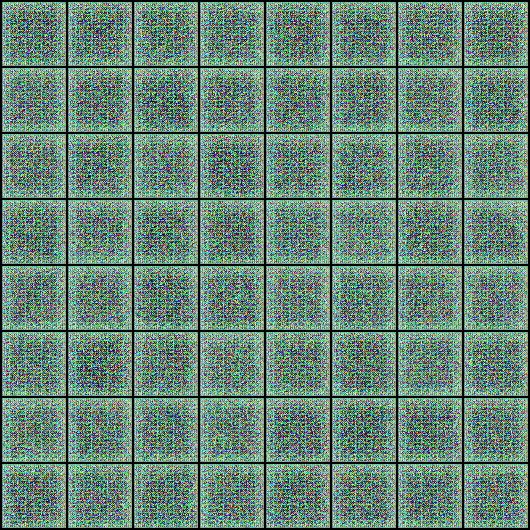

In [36]:
Image('./generated/generated-images-0001.png')

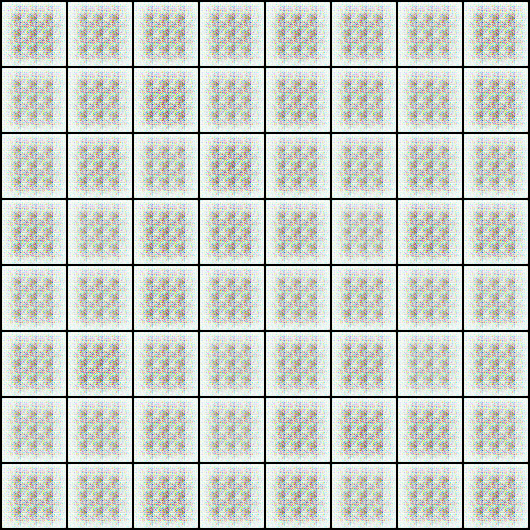

In [37]:
Image('./generated/generated-images-0020.png')

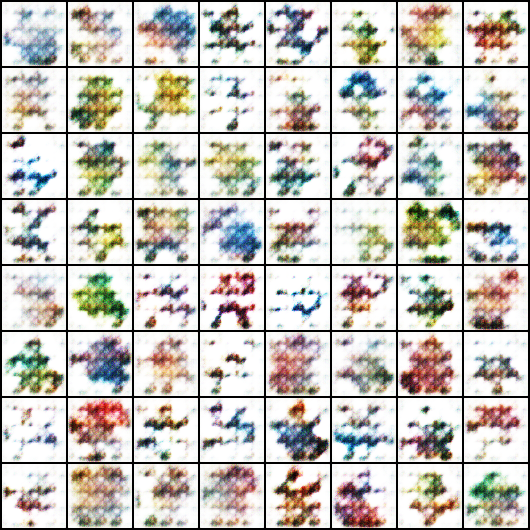

In [38]:
Image('./generated/generated-images-0100.png')

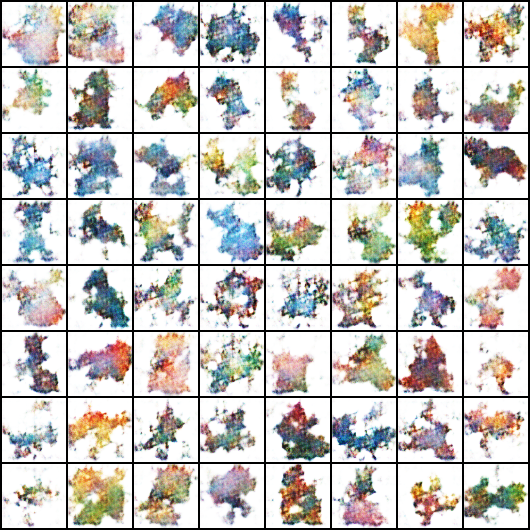

In [39]:
Image('./generated/generated-images-0200.png')

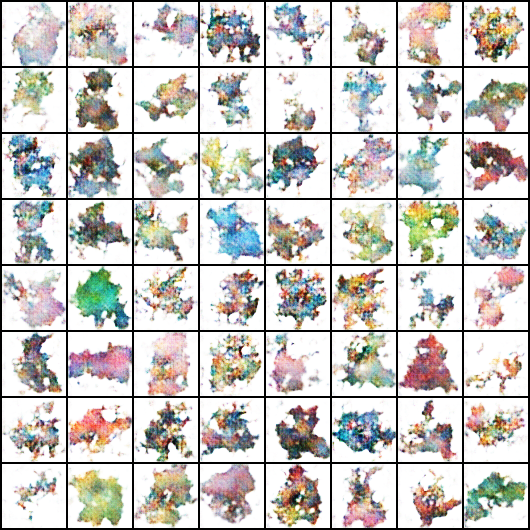

In [40]:
Image('./generated/generated-images-0300.png')

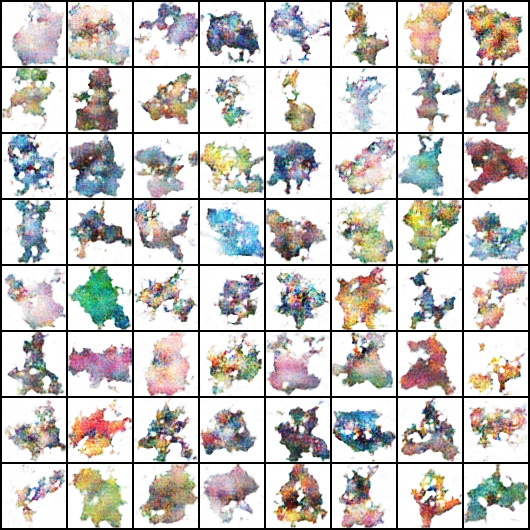

In [41]:
Image('./generated/generated-images-0400.png')

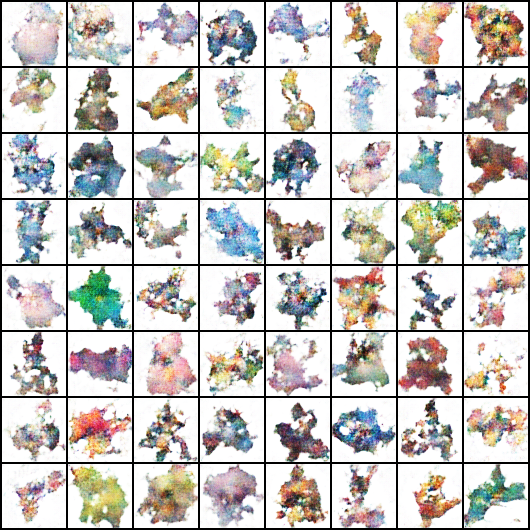

In [42]:
Image('./generated/generated-images-0500.png')

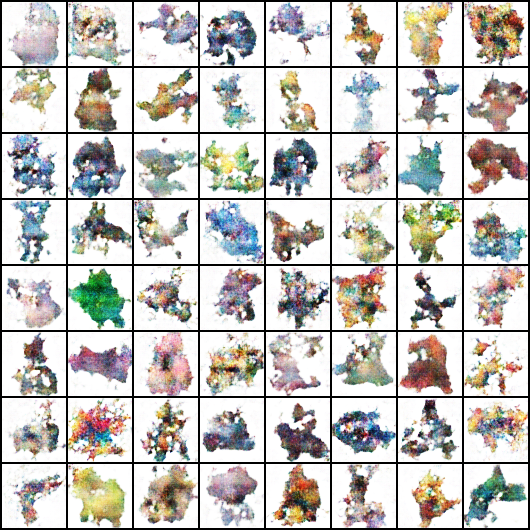

In [43]:
Image('./generated/generated-images-0600.png')

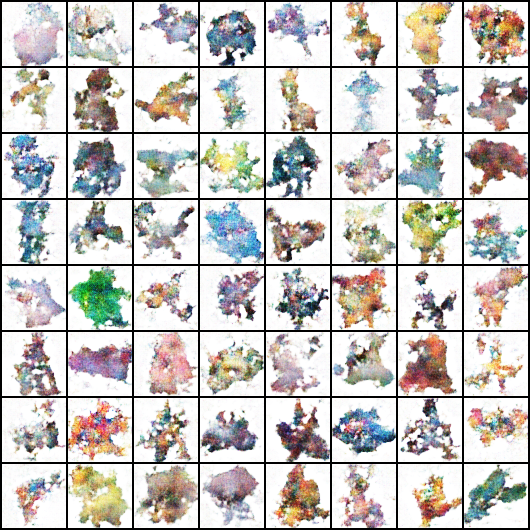

In [44]:
Image('./generated/generated-images-0700.png')

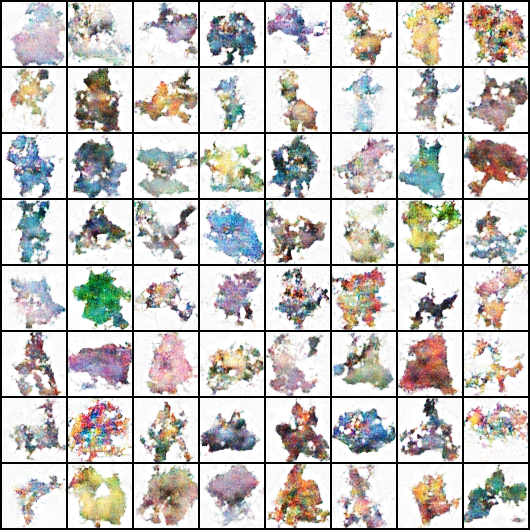

In [45]:
Image('./generated/generated-images-0800.png')

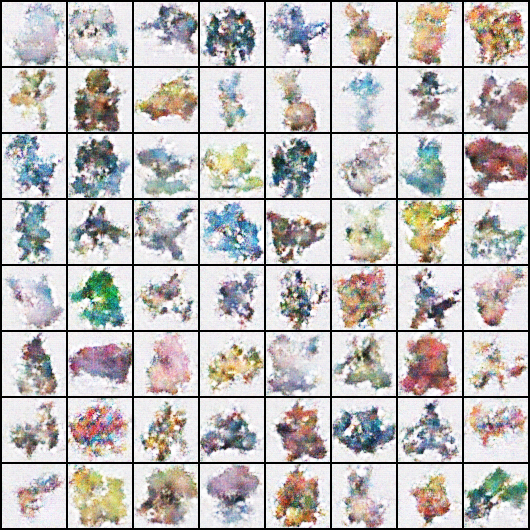

In [46]:
Image('./generated/generated-images-1000.png')

In [47]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

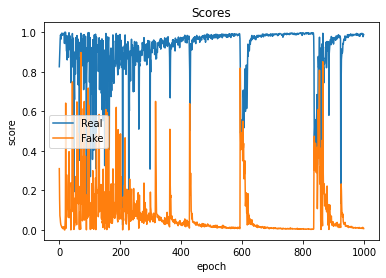

In [48]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

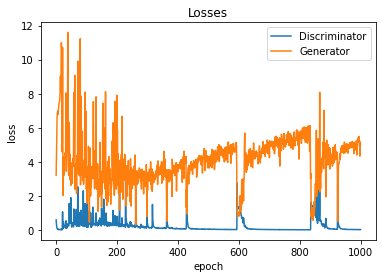

In [49]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

In [ ]:
import jovian

In [ ]:
jovian.commit(project=project_name, 
              outputs=['G.pth', 'D.pth', 'gans_training.avi'], 
              environment=None)

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...


[jovian] Error: Looks like the notebook is missing output cells, please save the notebook and try jovian.commit again.


[jovian] Uploading additional outputs...
[jovian] Attaching records (metrics, hyperparameters, dataset etc.)
Committed successfully! https://jovian.ai/anirbansaha/zerotogans-project


'https://jovian.ai/anirbansaha/zerotogans-project'

In [ ]:
jovian.submit(assignment="zerotogans-project")

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...


[jovian] Error: Looks like the notebook is missing output cells, please save the notebook and try jovian.commit again.


[jovian] Attaching records (metrics, hyperparameters, dataset etc.)
Committed successfully! https://jovian.ai/anirbansaha/zerotogans-project
[jovian] Submitting assignment..
[jovian] Verify your submission at https://jovian.ai/learn/deep-learning-with-pytorch-zero-to-gans/assignment/course-project
